In [2]:
# Supressing the warning messages
import warnings
warnings.filterwarnings('ignore')

# will make plot outputs appear and be stored within the notebook
%matplotlib inline

# import libaries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import datetime
from datetime import datetime, timedelta
import geopandas as gpd
from shapely.geometry import Point, Polygon
import geopy.distance
import contextily as ctx
import math
import matplotlib as mpl

from sklearn.linear_model import LinearRegression
from sklearn import neighbors
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.cluster import KMeans

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

# Data Collection and Preparation

## Divvy Data

In [3]:
# load .csv into pandas dataframe
chicago_2017 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2017.csv')

In [102]:
chicago_2017.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber


In [4]:
# Data Preparation Function 
def correct_data_types(chicagobikes):
  
    #Converting start-time to datetime
    chicagobikes['start'] = pd.to_datetime(chicagobikes['start_time']).dt.floor('min')
    #Converting end-time to datetime
    chicagobikes['end'] = pd.to_datetime(chicagobikes['end_time']).dt.floor('min')
    
   
    # rounding start time
    chicagobikes['time_rounded'] = chicagobikes['start'].dt.floor('H')
    
    # The day of the week with Monday=0, Sunday=6, week of year, month, day of month, hour of day
    chicagobikes['weekday'] = chicagobikes['time_rounded'].dt.weekday
    chicagobikes['week'] = chicagobikes['time_rounded'].dt.isocalendar().week
    chicagobikes['month'] = chicagobikes['time_rounded'].dt.month
    chicagobikes['day_of_month'] = chicagobikes['time_rounded'].dt.day
    chicagobikes['hour_of_day'] = chicagobikes['time_rounded'].dt.hour
  
    #trip duration
    chicagobikes['trip_duration'] = chicagobikes['end'] - chicagobikes['start']
    # date
    chicagobikes['date'] = chicagobikes['time_rounded'].dt.date
    
    return chicagobikes

In [14]:
def moving_average(array,n):
    target = []
    rng = n / 2 - 0.5
    rng = int(rng)
    i = 0
    while i < len(array):
        value = 0
        if (i >= rng-1) & (i< len(array)-rng):
            value = sum(array[i-rng:i+rng+1])/n
        target.append(value)
        i = i + 1
    i = 0
    while i < rng:
        target[i] = target[rng]
        target[-i-1] = target[-rng-1]
        i = i + 1
        
    return target

In [15]:
def min_max_scaling(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        
    return df_norm

In [16]:
def fleet_size(df,factor):
    
    start_date = df.date.min()
    end_date = df.date.max()
    delta = pd.to_timedelta("1d")
    dates = []
    while start_date <= end_date:
        dates.append(start_date)
        start_date += delta
    
    
    fleet_size = pd.DataFrame([], index = dates, columns = ["fleet_size"]) 

    search_array = []
    values = []
    for index, row in fleet_size.iterrows():
        search_array.append(index)
        if len(search_array) > factor:
            search_array.pop(0)
        values.append(df[df["date"].isin(search_array[:])].bike_id.nunique())
        
    i = 0
    
    #Erklärung hierfür
    correction = values[factor-1]
    while i < factor-1:
        values[i] = correction
        i = i + 1
    fleet_size["fleet_size"] = values
    
    return fleet_size

fleet_size = fleet_size(chicago_data,10)

In [5]:
# apply function for year 2017
chicago_data = correct_data_types(chicago_2017)

In [7]:
# Further exploration of dataset
chicago_data.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber,2017-03-31 23:59:00,2017-04-01 00:13:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:14:00,2017-03-31
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber,2017-03-31 23:56:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:04:00,2017-03-31
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber,2017-03-31 23:55:00,2017-04-01 00:01:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:06:00,2017-03-31
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber,2017-03-31 23:54:00,2017-03-31 23:59:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:05:00,2017-03-31
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber,2017-03-31 23:53:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:07:00,2017-03-31


In [8]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3829014 entries, 0 to 3829013
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedelt

In [9]:
# Nan ?
chicago_data.isna().sum()

start_time            0
end_time              0
start_station_id      0
end_station_id        0
start_station_name    0
end_station_name      0
bike_id               0
user_type             0
start                 0
end                   0
time_rounded          0
weekday               0
week                  0
month                 0
day_of_month          0
hour_of_day           0
trip_duration         0
date                  0
dtype: int64

In [10]:
chicago_data.nunique()

start_time            2823388
end_time              2736001
start_station_id          585
end_station_id            585
start_station_name        593
end_station_name          593
bike_id                  6243
user_type                   3
start                  407465
end                    407345
time_rounded             8743
weekday                     7
week                       52
month                      12
day_of_month               31
hour_of_day                24
trip_duration            1269
date                      365
dtype: int64

In [11]:
chicago_data['start_station_name'].value_counts()

Streeter Dr & Grand Ave         97571
Lake Shore Dr & Monroe St       53400
Canal St & Adams St             50911
Clinton St & Washington Blvd    49832
Theater on the Lake             47908
                                ...  
Throop St & 52nd St                 9
Seeley Ave & Garfield Blvd          8
Vernon Ave & 79th St                6
Ashland Ave & 66th St               4
Phillips Ave & 82nd St              3
Name: start_station_name, Length: 593, dtype: int64

In [12]:
chicago_data['end_station_name'].value_counts()

Streeter Dr & Grand Ave        106023
Lake Shore Dr & North Blvd      53091
Canal St & Adams St             52608
Theater on the Lake             50781
Clinton St & Madison St         50298
                                ...  
Ashland Ave & Garfield Blvd         8
Throop St & 52nd St                 5
Vernon Ave & 79th St                4
Ashland Ave & 66th St               4
Phillips Ave & 82nd St              2
Name: end_station_name, Length: 593, dtype: int64

In [13]:
# Misorders (same start and end station)
misorders = chicago_data[chicago_data['start_station_id'] == chicago_data['end_station_id']]
misorders.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date
50,3/31/2017 22:57:21,3/31/2017 23:06:40,303,303,Broadway & Cornelia Ave,Broadway & Cornelia Ave,3022,Subscriber,2017-03-31 22:57:00,2017-03-31 23:06:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:09:00,2017-03-31
113,3/31/2017 22:12:22,3/31/2017 22:21:50,45,45,Michigan Ave & Congress Pkwy,Michigan Ave & Congress Pkwy,1799,Customer,2017-03-31 22:12:00,2017-03-31 22:21:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:09:00,2017-03-31
115,3/31/2017 22:11:45,3/31/2017 22:21:25,45,45,Michigan Ave & Congress Pkwy,Michigan Ave & Congress Pkwy,4569,Customer,2017-03-31 22:11:00,2017-03-31 22:21:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:10:00,2017-03-31
116,3/31/2017 22:11:21,3/31/2017 22:21:50,45,45,Michigan Ave & Congress Pkwy,Michigan Ave & Congress Pkwy,2411,Customer,2017-03-31 22:11:00,2017-03-31 22:21:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:10:00,2017-03-31
132,3/31/2017 22:02:23,3/31/2017 22:37:31,2,2,Buckingham Fountain,Buckingham Fountain,5453,Customer,2017-03-31 22:02:00,2017-03-31 22:37:00,2017-03-31 22:00:00,4,13,3,31,22,0 days 00:35:00,2017-03-31


In [14]:
#Lets drop rows where start station equals end station (we assume a misorder by user)
chicago_data = chicago_data[chicago_data['start_station_id'] != chicago_data['end_station_id']]

In [15]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3707705 entries, 0 to 3829013
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedelt

In [16]:
#there seem to be 3 usertypes
chicago_data['user_type'].value_counts()

Subscriber    2946007
Customer       761693
Dependent           5
Name: user_type, dtype: int64

In [17]:
# Lets drop dependent entries, because only 5
chicago_data = chicago_data[chicago_data.user_type != 'Dependent']

## Weather Data

In [18]:
## Lets import weather data

In [179]:
# load .csv into pandas dataframe
weather_data = pd.read_csv('/Users/Lukas/Downloads/Chicago/Weather/weather_hourly_chicago.csv')

In [180]:
weather_data.head()

,date_time,max_temp,min_temp,precip
0,2015-01-02 01:00:00,-1.7,-1.7,0.0
1,2015-01-02 02:00:00,-2.2,-2.2,0.0
2,2015-01-02 03:00:00,-2.8,-2.8,0.0
3,2015-01-02 04:00:00,-3.3,-3.3,0.0
4,2015-01-02 05:00:00,-4.4,-4.4,0.0


In [181]:
# Data Preparation Function
def correct_weather(x):
  
    #Converting date to datetime
    x['date'] = pd.to_datetime(x['date_time'])
    #add weekday
    x['weekday'] = x['date'].dt.weekday
    #add week of year
    x['week'] = x['date'].dt.isocalendar().week
    return x
#apply function
weather_data = correct_weather(weather_data)

In [22]:
weather_data.head()

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1


In [23]:
#NaN?
weather_data.isna().sum()

date_time    60
max_temp     60
min_temp     60
precip       58
date         60
weekday      60
week         60
dtype: int64

In [24]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  43788 non-null  object        
 1   max_temp   43788 non-null  float64       
 2   min_temp   43788 non-null  float64       
 3   precip     43790 non-null  float64       
 4   date       43788 non-null  datetime64[ns]
 5   weekday    43788 non-null  float64       
 6   week       43788 non-null  UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(4), object(1)
memory usage: 2.2+ MB


In [25]:
## there seems to be missing data, lets display rows with missing data

# df has weird properties: index appears to be wrong (not soted by date), some hourly data seems to be missing (NaN rows as well as completely missing rows of hourly data) whereas other hourly data is reported twice
# example row 2535 and 2536 display the same time, whereas 2537 is missing
# we conclude that, duplicates were simply mislabeled, Nans were not labeled at all

In [182]:
weather_data.head(2538)

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1
...,...,...,...,...,...,...,...
2533,2015-04-16 13:00:00,7.8,7.2,0.0,2015-04-16 13:00:00,3.0,16
2534,2015-04-16 15:00:00,8.9,8.9,0.0,2015-04-16 15:00:00,3.0,16
2535,2015-04-16 16:00:00,9.4,9.4,0.0,2015-04-16 16:00:00,3.0,16
2536,2015-04-16 16:00:00,10.6,10.0,0.0,2015-04-16 16:00:00,3.0,16


In [27]:
weather_data.head(1591)

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1
...,...,...,...,...,...,...,...
1586,2015-03-09 03:00:00,1.7,1.7,0.0,2015-03-09 03:00:00,0.0,11
1587,2015-03-09 04:00:00,0.0,0.0,0.0,2015-03-09 04:00:00,0.0,11
1588,2015-03-09 05:00:00,-0.6,-0.6,0.0,2015-03-09 05:00:00,0.0,11
1589,NaN,NaN,NaN,NaN,NaT,NaN,<NA>


In [43]:
#sort values by date
weather_data.sort_values(by=['date'], inplace=True)

In [44]:
#drop NaN rows
weather_data.dropna(inplace=True)

In [45]:
#Let's drop rows with duplicate hourly values
weather_data = weather_data.drop_duplicates(subset=['date'], keep=False)

In [31]:
weather_data.tail()

,date_time,max_temp,min_temp,precip,date,weekday,week
43825,2020-01-02 02:00:00,5.0,5.0,0.0,2020-01-02 02:00:00,3.0,1
43826,2020-01-02 03:00:00,5.6,5.6,0.0,2020-01-02 03:00:00,3.0,1
43827,2020-01-02 04:00:00,5.6,5.6,0.0,2020-01-02 04:00:00,3.0,1
43828,2020-01-02 05:00:00,5.0,5.0,0.0,2020-01-02 05:00:00,3.0,1
43829,2020-01-02 06:00:00,5.6,5.6,0.0,2020-01-02 06:00:00,3.0,1


In [46]:
#reindex by timeframe of weather data to add missing hourly data rows

#set date column as index
weather_data.set_index('date', inplace=True)

#create hourly daterange 
all_times = pd.date_range(start='2015-01-01 00:00:00', end=weather_data.index.max(), freq ='H')

#reindex by range and reset index
weather_data = weather_data.reindex(all_times).reset_index()

In [33]:
weather_data.tail(20)

,index,date_time,max_temp,min_temp,precip,weekday,week
43835,2020-01-01 11:00:00,2020-01-01 11:00:00,-6.1,-6.1,0.0,2.0,1
43836,2020-01-01 12:00:00,2020-01-01 12:00:00,-6.1,-6.1,0.0,2.0,1
43837,2020-01-01 13:00:00,2020-01-01 13:00:00,-6.1,-6.1,0.0,2.0,1
43838,2020-01-01 14:00:00,2020-01-01 14:00:00,-6.1,-6.1,0.0,2.0,1
43839,2020-01-01 15:00:00,2020-01-01 15:00:00,-4.4,-4.4,0.0,2.0,1
43840,2020-01-01 16:00:00,2020-01-01 16:00:00,-2.2,-2.2,0.0,2.0,1
43841,2020-01-01 17:00:00,2020-01-01 17:00:00,-0.6,-0.6,0.0,2.0,1
43842,2020-01-01 18:00:00,2020-01-01 18:00:00,1.7,1.7,0.0,2.0,1
43843,2020-01-01 19:00:00,2020-01-01 19:00:00,3.3,3.3,0.0,2.0,1
43844,2020-01-01 20:00:00,2020-01-01 20:00:00,4.4,4.4,0.0,2.0,1


In [34]:
#NaNs from missing rows 
weather_data.isna().sum()

index           0
date_time    5723
max_temp     5723
min_temp     5723
precip       5723
weekday      5723
week         5723
dtype: int64

In [35]:
#show NaN rows
weather_data[weather_data.isna().any(axis=1)]

,index,date_time,max_temp,min_temp,precip,weekday,week
0,2015-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
1,2015-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
2,2015-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
3,2015-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
4,2015-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
...,...,...,...,...,...,...,...
43805,2019-12-31 05:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43806,2019-12-31 06:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43812,2019-12-31 12:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43826,2020-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,<NA>


In [47]:
## Lets fix Nans

## Impute missing data (because missing data can be estimated easily and more accurate results)

#interpolation for weather data
weather_data['max_temp'].interpolate(method='slinear', inplace=True) 
weather_data['min_temp'].interpolate(method='slinear', inplace=True) 

#backward fill for precip (snow etc.) because can only be 0 or 1
weather_data['precip'].fillna(method='bfill', inplace=True) 

#drop columns not needed
weather_data = weather_data[['index', 'max_temp', 'min_temp', 'precip']]

In [48]:
#7 more Nans and simplified df!
weather_data.isna().sum()

index       0
max_temp    7
min_temp    7
precip      0
dtype: int64

In [49]:
#Lets fix those 7 NaNs in the beginning of dataset
#we will use fillna function as interpolation didnt work for those
weather_data['max_temp'].fillna(method='bfill', inplace=True)
weather_data['min_temp'].fillna(method='bfill', inplace=True)

In [50]:
weather_data.isna().sum()

index       0
max_temp    0
min_temp    0
precip      0
dtype: int64

In [51]:
weather_data.head(52)

,index,max_temp,min_temp,precip
0,2015-01-01 00:00:00,-8.3,-8.3,0.0
1,2015-01-01 01:00:00,-8.3,-8.3,0.0
2,2015-01-01 02:00:00,-8.3,-8.3,0.0
3,2015-01-01 03:00:00,-8.3,-8.3,0.0
4,2015-01-01 04:00:00,-8.3,-8.3,0.0
5,2015-01-01 05:00:00,-8.3,-8.3,0.0
6,2015-01-01 06:00:00,-8.3,-8.3,0.0
7,2015-01-01 07:00:00,-8.3,-8.3,0.0
8,2015-01-01 08:00:00,-8.9,-8.9,0.0
9,2015-01-01 09:00:00,-8.9,-8.9,0.0


In [52]:
#as we can see in row 49, the imputation of Nans worked perfectly

In [53]:
##we need roughly 24h x 365d x 5y = 43800 entries of weather data
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43855 entries, 0 to 43854
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   index     43855 non-null  datetime64[ns]
 1   max_temp  43855 non-null  float64       
 2   min_temp  43855 non-null  float64       
 3   precip    43855 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.3 MB


In [55]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3707700 entries, 0 to 3829013
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedelt

In [ ]:
# Further Preparation

In [57]:
# calculate trips per hour
chicago_data['trips_per_hour']= chicago_data.groupby(['time_rounded'])['time_rounded'].transform('count')

In [58]:
chicago_data.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber,2017-03-31 23:59:00,2017-04-01 00:13:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:14:00,2017-03-31,49
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber,2017-03-31 23:56:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:04:00,2017-03-31,49
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber,2017-03-31 23:55:00,2017-04-01 00:01:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:06:00,2017-03-31,49
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber,2017-03-31 23:54:00,2017-03-31 23:59:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:05:00,2017-03-31,49
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber,2017-03-31 23:53:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:07:00,2017-03-31,49


In [207]:
# Create additional dataframe
# drop rows with identical time_rounded values for next step, so we have 1 representative row per hour
filtered_df = chicago_data.drop_duplicates(subset='time_rounded')

In [208]:
#Let's look for missing hourly data
filtered_df.sort_values(by=['time_rounded'], inplace=True)
filtered_df = filtered_df.set_index('time_rounded')

#Lets show missing hourly values
filtered_times = pd.date_range(start = filtered_df.index.min(), end = filtered_df.index.max(), freq='H')

filtered_times.difference(filtered_df.index)

DatetimeIndex(['2017-01-09 03:00:00', '2017-01-17 03:00:00',
               '2017-02-09 02:00:00', '2017-02-10 03:00:00',
               '2017-03-07 02:00:00', '2017-03-12 02:00:00',
               '2017-03-30 02:00:00', '2017-12-13 02:00:00',
               '2017-12-20 00:00:00', '2017-12-20 01:00:00',
               '2017-12-20 02:00:00', '2017-12-20 03:00:00',
               '2017-12-20 04:00:00', '2017-12-20 05:00:00',
               '2017-12-25 23:00:00', '2017-12-26 01:00:00',
               '2017-12-27 02:00:00', '2017-12-30 05:00:00'],
              dtype='datetime64[ns]', freq=None)

In [209]:
#reindex and reset
filtered_df = filtered_df.reindex(filtered_times).reset_index()
#rename
filtered_df.rename(columns={'index': 'time_rounded'}, inplace=True)

In [210]:
#We have 18 missing rows, but we have the time for each
filtered_df.isna().sum()

time_rounded           0
start_time            18
end_time              18
start_station_id      18
end_station_id        18
start_station_name    18
end_station_name      18
bike_id               18
user_type             18
start                 18
end                   18
weekday               18
week                  18
month                 18
day_of_month          18
hour_of_day           18
trip_duration         18
date                  18
trips_per_hour        18
revenue               18
dtype: int64

In [211]:
filtered_df[filtered_df.isna().any(axis=1)]

,time_rounded,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,revenue
195,2017-01-09 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
387,2017-01-17 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
938,2017-02-09 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
963,2017-02-10 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
1562,2017-03-07 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
1682,2017-03-12 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
2114,2017-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
8306,2017-12-13 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
8472,2017-12-20 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN
8473,2017-12-20 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,<NA>,NaN,NaN,NaN,NaT,NaN,NaN,NaN


In [212]:
#Let's impute missing hours, unforunately we cannot impute start station etc., so we use imputed data only for regression later on


#we assume 0 rides in those hours
filtered_df['trips_per_hour'].fillna(value=0, inplace=True) 
#other columns
filtered_df['weekday'].fillna(method="ffill", inplace=True) 
filtered_df['week'].fillna(method="ffill", inplace=True) 
filtered_df['day_of_month'].fillna(method="ffill", inplace=True) 
filtered_df['hour_of_day'].fillna(method="ffill", inplace=True) 
filtered_df['month'].fillna(method="ffill", inplace=True)

# Descriptive Analytics

## Temporal Demand Patterns and Seasonality

In [ ]:
# Demonstrate how fleet usage varies during a day, a week and the year. 
# What patterns do you observe? Explain.

### Overview

Text(0, 0.5, 'amount of trips per hour')

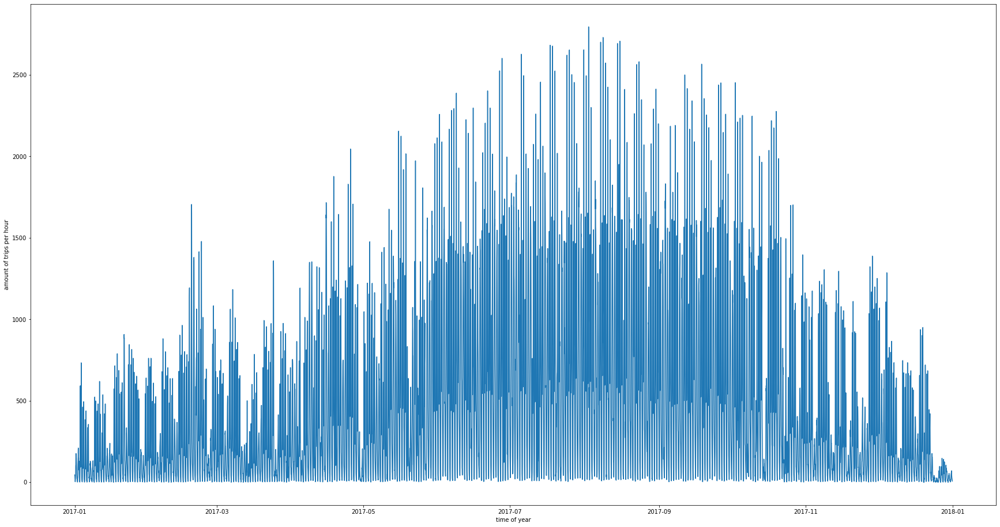

In [65]:
#plot hourly trips over year
plt.figure(figsize=(30,16))
plt.plot(filtered_df['time_rounded'], filtered_df['trips_per_hour'])
plt.xlabel('time of year')
plt.ylabel('amount of trips per hour')

In [213]:
#create daily trips df
filtered_df['time_rounded'] = pd.to_datetime(filtered_df['time_rounded'])
filtered_df['date'] = filtered_df['time_rounded'].dt.date

daily = filtered_df.groupby('date').agg(daily_trips=("trips_per_hour","sum"))

### Trip Duration

In [68]:
#Lets explore trip duration 

In [69]:
durat = chicago_data[['trip_duration', 'time_rounded', 'user_type']]

In [70]:
#convert to datetime and call hour of day and trip duration in minutes
durat['time_rounded'] = durat['time_rounded'].dt.hour
durat['trip_duration'] = durat['trip_duration'].dt.seconds.div(60)

Text(0, 0.5, 'Frequency (in Mio.)')

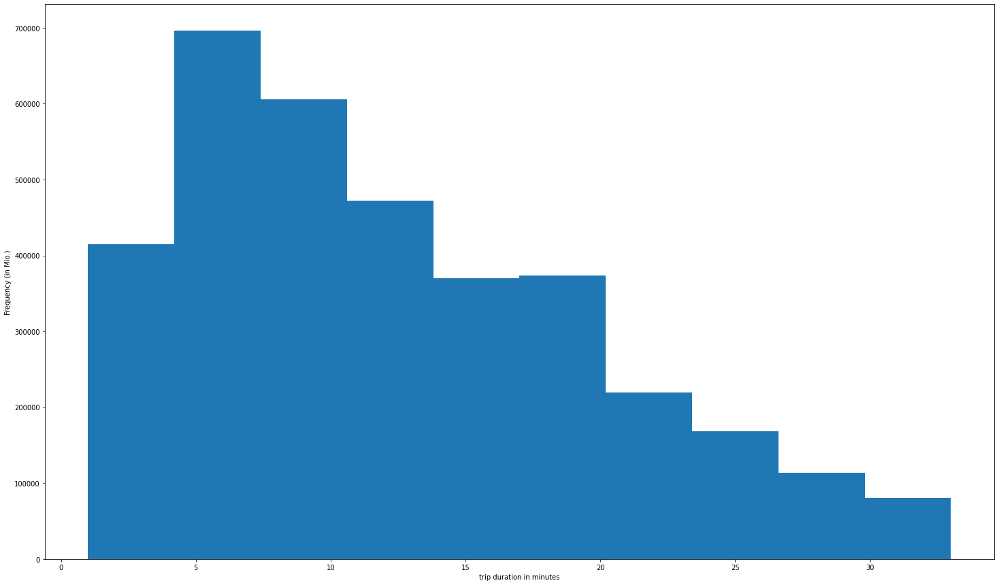

In [185]:
duration = durat['trip_duration']
plt.figure(figsize=(25,15))
duration[duration < duration.quantile(.95)].plot.hist()
plt.xlabel('trip duration in minutes')
plt.ylabel('amount of rides')

In [ ]:
# observations: most rides seem to take about 5-10 minutes

Text(0, 0.5, 'Frequency (in Mio.)')

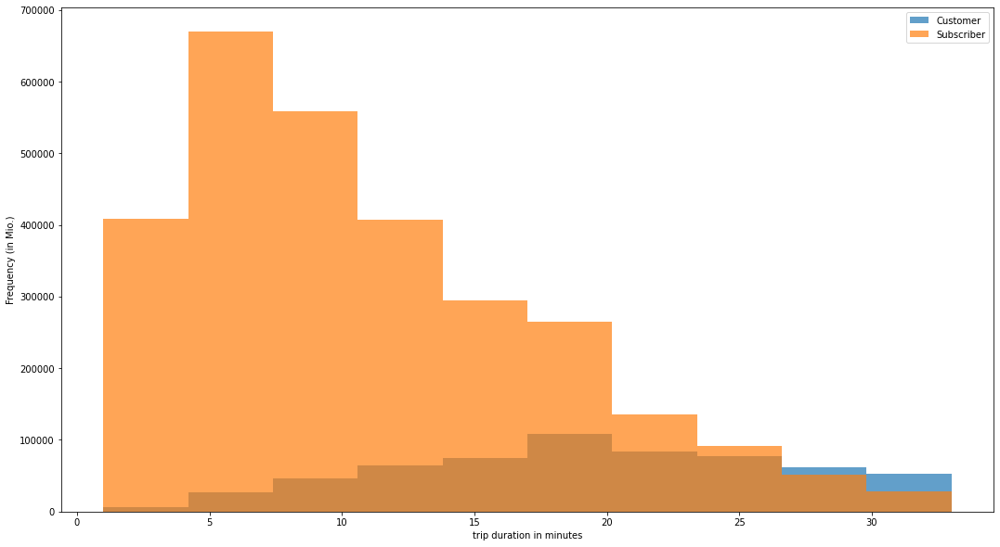

In [72]:
# trip_duration distribution by customer type
# observations: most clients seem to be subscribers already. While subscribers mostly drive relatively short distances, customers take longer routes.

plt.figure(figsize=(18,10))
# plot histogram grouped by usertype
durat[duration < duration.quantile(.95)] \
  .groupby('user_type')['trip_duration'].plot.hist(stacked=True, legend=True, alpha=0.7)

plt.xlabel('trip duration in minutes')
plt.ylabel('amount of trips')

### Daily Patterns

In [73]:
#average trip length per hour of day
durat_daily = durat.groupby('time_rounded').agg(mean_durat=('trip_duration', 'mean'))

Text(0, 0.5, 'mean trip duration (in minutes)')

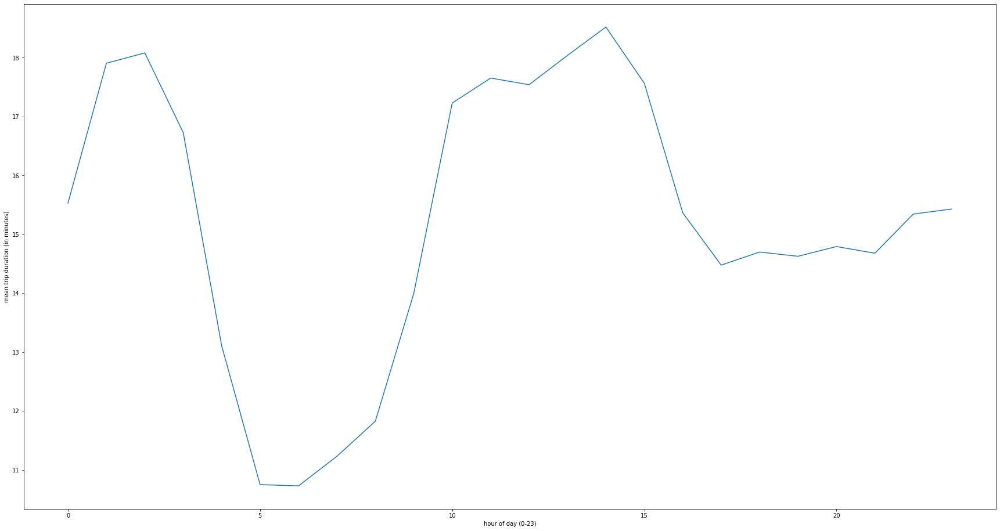

In [194]:
#plot trip duration per hour of day
plt.figure(figsize=(30,16))
plt.plot(durat_daily)
plt.xlabel('hour of day (0-23)')
plt.ylabel('mean trip duration (in minutes)')

In [ ]:
# observations: longest rides are in the morning (2-3am) and during the day (10am-15pm)

In [ ]:
#avg amount trips per hour of day

Text(0, 0.5, 'average amount of trips')

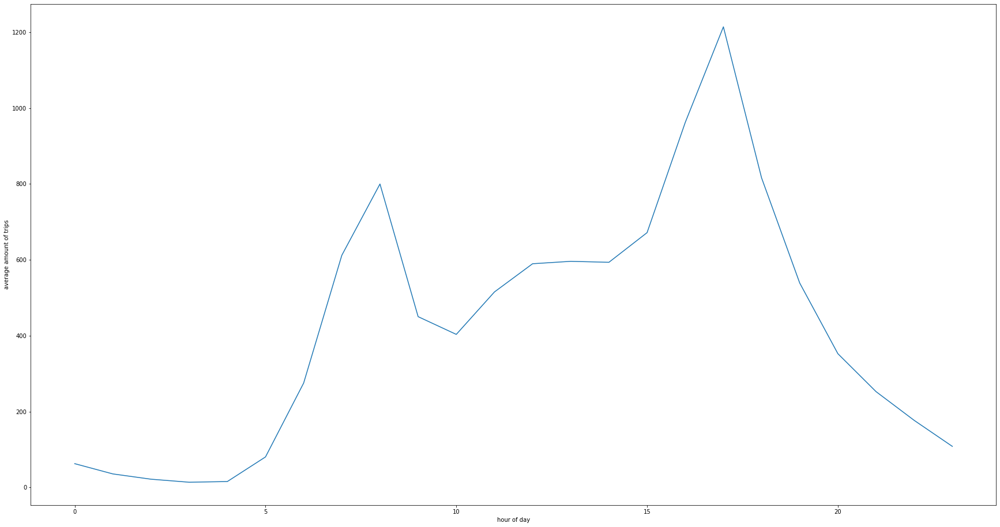

In [190]:
trips_hourofday = filtered_df.groupby('hour_of_day').agg(trips=('trips_per_hour','mean'))
plt.figure(figsize=(30,16))
plt.plot(trips_hourofday)
plt.xlabel('hour of day')
plt.ylabel('mean amount of trips')

In [ ]:
# observations: peak demand times are found in the morning 7-8am and afternoon (16-18pm)

### Weekly Patterns

In [215]:
# average trips per day of week

# find weekday
daily = daily.reset_index()
daily['datetime'] = pd.to_datetime(daily['date'])
daily['weekday'] = daily['datetime'].dt.weekday
daily['week'] = daily['datetime'].dt.isocalendar().week

Text(0, 0.5, 'average amount of trips')

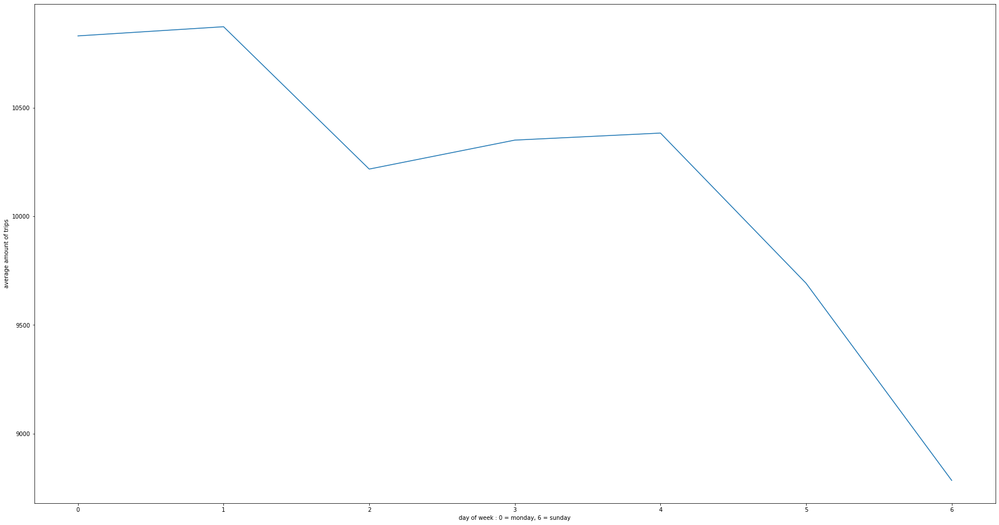

In [216]:
#plot amount of trips per weekday
day_of_week = daily.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(30,16))
plt.plot(day_of_week)
plt.xlabel('day of week : 0 = monday, 6 = sunday')
plt.ylabel('average amount of trips')

In [217]:
## you can spot that, on average, fleet usage is on its highest at the beginning of the week (monday and tuesday) and then drops towards the weekend. 

In [79]:
# Lets investigate further: We know weekdays 0-4 are workdays, 5-6 are weekend.
workdays = daily[daily.weekday.isin([0,1,2,3,4])]
weekend = daily[daily.weekday.isin([5,6])]

In [80]:
weekend.head()

,date,daily_trips,datetime,weekday,week
0,2017-01-01,1651.0,2017-01-01,6,52
6,2017-01-07,1301.0,2017-01-07,5,1
7,2017-01-08,1170.0,2017-01-08,6,1
13,2017-01-14,2112.0,2017-01-14,5,2
14,2017-01-15,2128.0,2017-01-15,6,2


Text(0, 0.5, 'mean amount of trips')

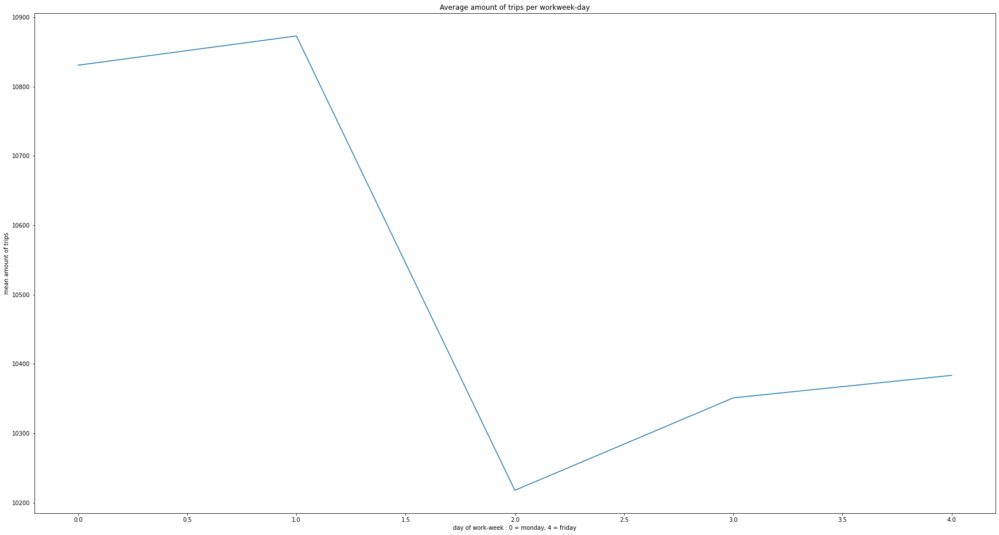

In [195]:
#Lets plot workdays

workdays_plot = workdays.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(30,16))
plt.plot(workdays_plot)
plt.title('Average amount of trips per workweek-day')
plt.xlabel('day of work-week : 0 = monday, 4 = friday')
plt.ylabel('mean amount of trips')

In [604]:
#average amount of trips are highest on workdays, Tuesday beeing the most busy day out of all.

Text(0, 0.5, 'mean amount of trips')

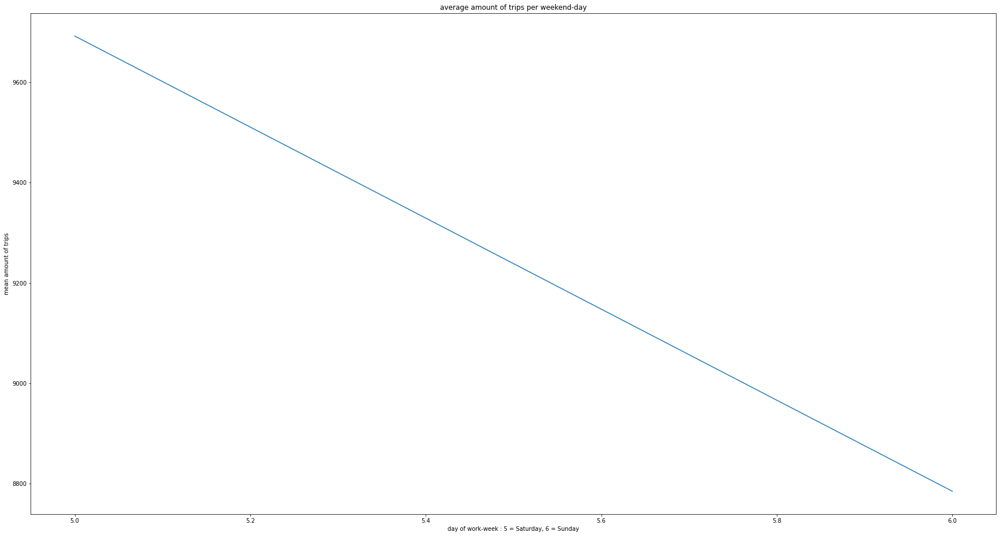

In [82]:
#Lets plot weekend

weekend_plot = weekend.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(30,16))
plt.plot(weekend_plot)
plt.title('average amount of trips per weekend-day')
plt.xlabel('day of work-week : 5 = Saturday, 6 = Sunday')
plt.ylabel('mean amount of trips')

In [83]:
#as expected, usage drops on weekend to under 8.000 trips a day, sunday beeing the least popular day.

### Yearly/Seasonal Patterns

Text(0, 0.5, 'amount of trips per day')

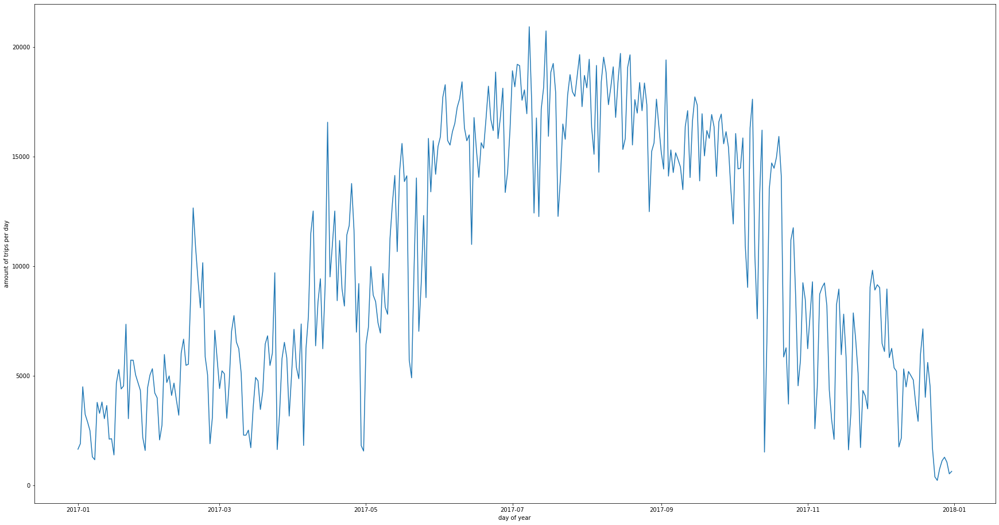

In [221]:
# Plot daily trips over year
plt.figure(figsize=(30,16))
plt.plot(daily['date'], daily['daily_trips'])
plt.xlabel('day of year')
plt.ylabel('amount of trips per day')

Text(0, 0.5, 'total amount of trips')

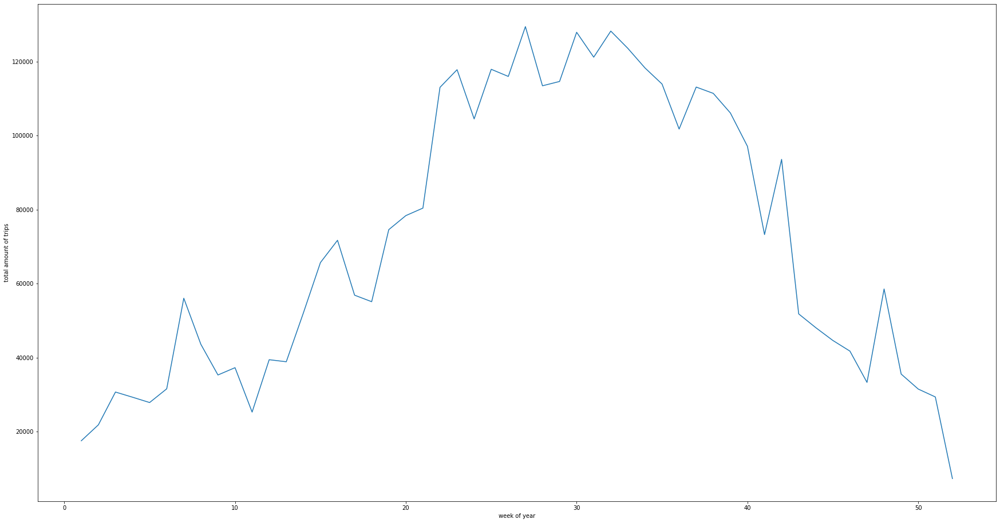

In [187]:
# create weekly df for simplification
weekly = daily.groupby('week').agg(week_total_trips = ("daily_trips", "sum"))
#plot
plt.figure(figsize=(30,16))
plt.plot(weekly)
plt.xlabel('week of year')
plt.ylabel('total amount of trips')

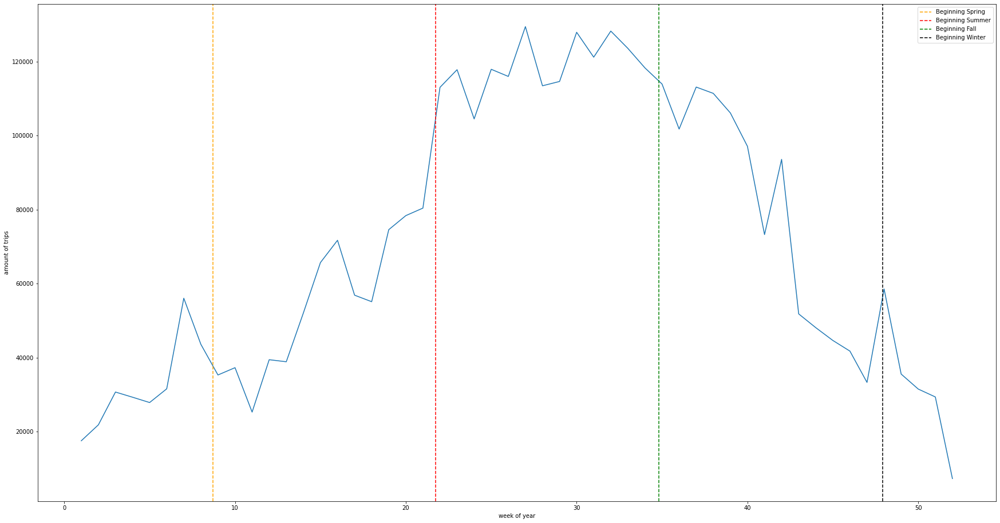

In [222]:
#mean trips are highest towards the middle of calender weeks in a year

plt.figure(figsize=(30,16))
plt.plot(weekly)

#add season marker (northern hemnisphere), Meteorological Start approximately by calendar week, to provide orientation
plt.axvline(x = 8.7, label = 'Beginning Spring', color = 'orange', linestyle = '--')
plt.axvline(x = 21.75, label = 'Beginning Summer', color = 'red', linestyle = '--')
plt.axvline(x = 34.8, label = 'Beginning Fall', color = 'green', linestyle = '--')
plt.axvline(x = 47.9, label = 'Beginning Winter', color = 'black', linestyle = '--')

plt.xlabel('week of year')
plt.ylabel('amount of trips')
plt.legend(prop = {'size':10})


In [ ]:
#observations: demand ovbiously highest in summer, lowest in winter

## Geographical Demand Patterns

In [ ]:
# Which stations are particularly popular and which are not? Provide a rationale as to why you observe these patterns. 

In [86]:
# you can observe that no matter start or end station, there seems to be a clear popularity trend amongst the stations
# for example 'Streeter Dr & Grand Ave' station is the Navy Pier, one of the most popular tourist attractions in the city

In [87]:
# calculate counts per unique start station
chicago_data['start_station_name'].value_counts()

Streeter Dr & Grand Ave         87529
Canal St & Adams St             50662
Clinton St & Washington Blvd    49681
Lake Shore Dr & Monroe St       47953
Lake Shore Dr & North Blvd      45222
                                ...  
Commercial Ave & 83rd St            8
Seeley Ave & Garfield Blvd          6
Ashland Ave & 66th St               4
Vernon Ave & 79th St                3
Phillips Ave & 82nd St              1
Name: start_station_name, Length: 593, dtype: int64

In [88]:
# calculate counts per unique end station
chicago_data['end_station_name'].value_counts()

Streeter Dr & Grand Ave       95981
Canal St & Adams St           52359
Lake Shore Dr & North Blvd    50539
Clinton St & Madison St       50018
Theater on the Lake           47707
                              ...  
Racine Ave & 61st St              7
Seeley Ave & Garfield Blvd        7
Throop St & 52nd St               5
Ashland Ave & 66th St             4
Vernon Ave & 79th St              1
Name: end_station_name, Length: 592, dtype: int64

In [89]:
#import chicago streets shapefile
streets = gpd.read_file('/Users/Lukas/Downloads/Street_center_lines/geo_export_5be3973d-042a-4557-ace5-cf6a567ad6e0.shp')

,class,date_creat,time_creat,create_use,dir_travel,edit_date,edit_type,ewns,ewns_coord,ewns_dir,...,t_cross,t_cross_st,t_zlev,tiered,tnode_id,trans_id,date_updat,time_updat,update_use,geometry
0,4,1999-01-01,00:00:00.000,EXISTING,F,0.0,None,-232.0,232.0,W,...,6250|S|||,0.0,0.0,N,16581.0,127104.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.63187 41.78081, -87.63185 41.7..."
1,2,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,0.0,0.0,None,...,800|E|74TH|ST|,172.0,0.0,N,34082.0,128895.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.60549 41.76223, -87.60548 41.7..."
2,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-2500.0,2500.0,W,...,2500|W|109TH|ST|,1805.0,0.0,N,22358.0,142645.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.68382 41.69724, -87.68381 41.6..."
3,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-932.0,932.0,W,...,||DEAD END||,0.0,0.0,N,28881.0,148189.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.64584 41.69340, -87.64624 41.6..."
4,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-11800.0,11800.0,S,...,11799|S|CHURCH|ST|,1214.0,0.0,N,36534.0,139728.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.67054 41.67976, -87.67071 41.6..."


In [90]:
# show all columns and show sample of shapefile
pd.set_option('display.max_columns', None)
streets.sample(5)

,class,date_creat,time_creat,create_use,dir_travel,edit_date,edit_type,ewns,ewns_coord,ewns_dir,f_cross,f_cross_st,f_zlev,flag_strin,fnode_id,l_censusbl,l_f_add,l_fips,l_parity,l_t_add,l_zip,length,logiclf,logiclt,logicrf,logicrt,objectid,oneway_dir,pre_dir,r_censusbl,r_f_add,r_fips,r_parity,r_t_add,r_zip,shape_len,status,date_statu,time_statu,street_nam,street_typ,streetname,suf_dir,t_cross,t_cross_st,t_zlev,tiered,tnode_id,trans_id,date_updat,time_updat,update_use,geometry
11941,4,1999-01-01,00:00:00.000,EXISTING,B,20100318.0,Street Class Change,-5900.0,5900.0,S,5900|S|NEWCASTLE|AVE|,1633.0,0.0,None,2071.0,170316404003001,6833.0,14000.0,O,6859.0,60638,329.195046,6833.0,6899.0,6832.0,6898.0,12530.0,None,W,170315610004006,6832.0,14000.0,E,6858.0,60638,329.195046,N,1999-01-01,00:00:00.000,59TH,ST,1935.0,None,5900|S|NEW ENGLAND|AVE|,1631.0,0.0,N,7957.0,133874.0,2010-03-18,00:00:00.000,ds06027,"LINESTRING (-87.79252 41.78483, -87.79267 41.7..."
18736,4,1999-01-01,00:00:00.000,EXISTING,T,0.0,None,-5232.0,5232.0,W,5231|W|THOMAS|ST|,2557.0,0.0,None,10193.0,170312512001001,1100.0,14000.0,E,1158.0,60651,666.957498,1100.0,1198.0,1101.0,1199.0,19278.0,S,N,170312512001000,1101.0,14000.0,O,1159.0,60651,666.957511,N,1999-01-01,00:00:00.000,LATROBE,AVE,705.0,None,5235|W|DIVISION|ST|,2150.0,0.0,N,34047.0,120727.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.75696 41.90041, -87.75697 41.9..."
17467,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,6300.0,6300.0,N,6199|N|NASSAU|AVE|,871.0,0.0,None,7234.0,170311002003004,6659.0,14000.0,O,6681.0,60631,251.996408,6659.0,6699.0,6658.0,6698.0,17624.0,None,W,170311002002005,6658.0,14000.0,E,6678.0,60631,251.996378,N,1999-01-01,00:00:00.000,RAVEN,ST,2489.0,None,6200|N|OAK PARK|AVE|,904.0,0.0,N,24559.0,105256.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.79390 41.99370, -87.79417 41.9..."
1336,2,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-6432.0,6432.0,W,5549|N|||,0.0,0.0,None,145.0,170311006001002,5550.0,14000.0,E,5554.0,60630,92.745980,5550.0,5574.0,5551.0,5573.0,889.0,None,N,170311103001002,5551.0,14000.0,O,5553.0,60630,92.746004,N,1999-01-01,00:00:00.000,NAGLE,AVE,864.0,None,5576|N|||,0.0,0.0,N,17753.0,105859.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.78775 41.98236, -87.78774 41.9..."
16067,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-7200.0,7200.0,S,7200|S|SEELEY|AVE|,1700.0,0.0,None,6483.0,170316720004009,2033.0,14000.0,O,2059.0,60636,330.808991,2033.0,2099.0,2032.0,2098.0,16586.0,None,W,170316720004008,2032.0,14000.0,E,2058.0,60636,330.809026,N,1999-01-01,00:00:00.000,72ND,ST,1961.0,None,7200|S|HOYNE|AVE|,1426.0,0.0,N,6485.0,129267.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.67470 41.76298, -87.67480 41.7..."


In [91]:
# import Divvy stations location data (retrived online)
stations = pd.read_csv('/Users/Lukas/Downloads/Divvy_Bicycle_Stations_-_All_-_Map.csv')

In [92]:
# show sample data
stations.sample(5)

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)"
1,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)"
2,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)"
3,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)"
4,560,Marshfield Ave & 59th St,11,11,In Service,41.786833,-87.666215,"(41.786833, -87.666215)"


In [93]:
#get geo Data by using Point and long, lat information
geometry = [Point (xy) for xy in zip(stations['Longitude'], stations['Latitude'])]

In [94]:
#checking if worked
geometry[:5]

In [95]:
#create geodataframe with stations and their geometry we just calculated
stations_geo = gpd.GeoDataFrame(stations, geometry = geometry)
stations_geo.head()

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,geometry
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)",POINT (-87.70613 41.89547)
1,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)",POINT (-87.58534 41.77346)
2,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)",POINT (-87.71512 41.85406)
3,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)",POINT (-87.67701 41.88595)
4,560,Marshfield Ave & 59th St,11,11,In Service,41.786833,-87.666215,"(41.786833, -87.666215)",POINT (-87.66622 41.78683)


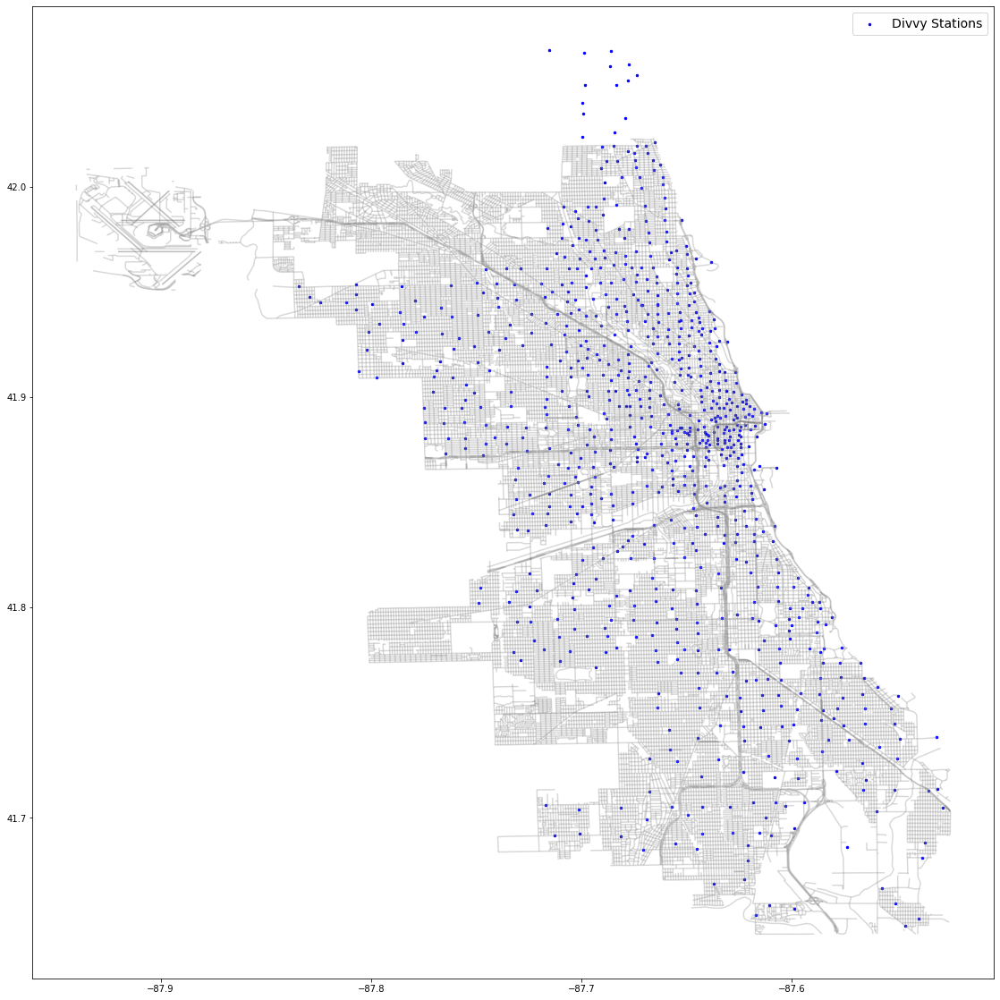

In [99]:
#plot of Divvy stations on chicago street shapefile
fig, ax = plt.subplots(figsize = (35,20))
streets.plot(ax = ax, alpha=0.3, color= 'grey')
stations_geo.plot(ax = ax, marker='o', markersize = 6, color='blue', label = 'Divvy Stations')
plt.legend(prop = {'size':14})

In [100]:
#observations: divvy stations are clearly concentrated towards the city centre and even the seaside
#part of the shapefile seems to be missing, the missing district is called 'Evanston'

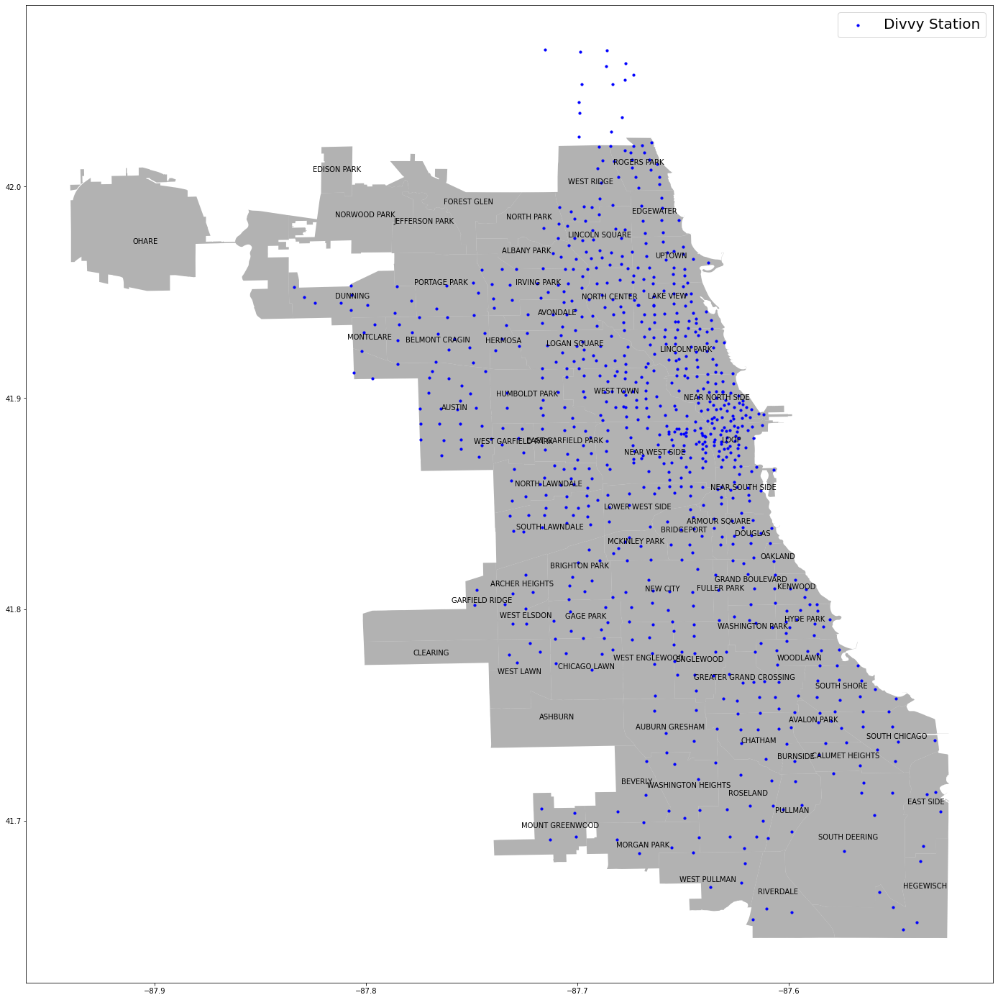

In [101]:
#plot stations against city districts
districts = gpd.read_file('/Users/Lukas/Downloads/Boundaries - Community Areas (current)-2/geo_export_5e9bdce9-952c-4fb4-85ea-cebefa5c92ef.shp')
#find random coordinate in Polygon to position district label later on
districts['coords'] = districts['geometry'].apply(lambda x: x.representative_point().coords[:])
districts['coords'] = [coords[0] for coords in districts['coords']]  
fig, ax = plt.subplots(figsize = (40,25))

districts.plot(ax = ax, alpha=0.6, color= 'grey')
stations_geo.plot(ax = ax, marker='o', markersize = 10, color='blue', label = 'Divvy Station')
plt.legend(prop = {'size':20})

#annotate community name for every district at estimated coords
for index, row in districts.iterrows():
    plt.annotate(s=row['community'], xy=row['coords'],
                 horizontalalignment='center', fontsize='10', color='black')


In [ ]:
## observations: the highest concentration of Divvy Stations is found in the districts 'Near North Side', 'Loop', 'Near South Side', 'Lincoln Park', 'Lake View', etc.
# This makes sense considering lake michigan is located to the east of the above map. The lakeside includes multiple beaches, the navy pier, multiple museums, tourist attractions and of course provides for a beautiful skyline.

In [271]:
# lets merge dataframes on Divvy start station Id
chicago_geo = pd.merge(chicago_data,stations_geo,left_on=['start_station_id'], right_on = ['ID'], how = 'left') 

# on end station aswell
chicago_geo = pd.merge(chicago_geo,stations_geo,left_on=['end_station_id'], right_on = ['ID'], how = 'left')

In [255]:
#NaN rows remain, lets drop them
chicago_geo.isna().sum()

start_time               0
end_time                 0
start_station_id         0
end_station_id           0
start_station_name       0
end_station_name         0
bike_id                  0
user_type                0
start                    0
end                      0
time_rounded             0
weekday                  0
week                     0
month                    0
day_of_month             0
hour_of_day              0
trip_duration            0
date                     0
trips_per_hour           0
revenue                  0
ID_x                  4961
Station Name_x        4961
Total Docks_x         4961
Docks in Service_x    4961
Status_x              4961
Latitude_x            4961
Longitude_x           4961
Location_x            4961
geometry_x            4961
ID_y                  4864
Station Name_y        4864
Total Docks_y         4864
Docks in Service_y    4864
Status_y              4864
Latitude_y            4864
Longitude_y           4864
Location_y            4864
g

In [272]:
chicago_geo = chicago_geo.dropna(axis=0, how="any")

In [257]:
chicago_geo.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,revenue,ID_x,Station Name_x,Total Docks_x,Docks in Service_x,Status_x,Latitude_x,Longitude_x,Location_x,geometry_x,ID_y,Station Name_y,Total Docks_y,Docks in Service_y,Status_y,Latitude_y,Longitude_y,Location_y,geometry_y
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber,2017-03-31 23:59:00,2017-04-01 00:13:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:14:00,2017-03-31,49,3.3,66.0,Clinton St & Lake St,23.0,23.0,In Service,41.885637,-87.641823,"(41.885637, -87.641823)",POINT (-87.64182 41.88564),171.0,May St & Cullerton St,11.0,11.0,In Service,41.855136,-87.654127,"(41.855136, -87.654127)",POINT (-87.65413 41.85514)
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber,2017-03-31 23:56:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:04:00,2017-03-31,49,3.3,199.0,Wabash Ave & Grand Ave,31.0,31.0,In Service,41.891466,-87.626761,"(41.891466, -87.626761)",POINT (-87.62676 41.89147),26.0,New St & Illinois St,31.0,31.0,In Service,41.890847,-87.618617,"(41.890847040623804, -87.61861681938171)",POINT (-87.61862 41.89085)
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber,2017-03-31 23:55:00,2017-04-01 00:01:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:06:00,2017-03-31,49,3.3,520.0,Greenview Ave & Jarvis Ave,19.0,19.0,In Service,42.015962,-87.668570,"(42.015962, -87.66857)",POINT (-87.66857 42.01596),432.0,Clark St & Lunt Ave,19.0,19.0,In Service,42.009011,-87.674112,"(42.009011180580764, -87.67411172389984)",POINT (-87.67411 42.00901)
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber,2017-03-31 23:54:00,2017-03-31 23:59:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:05:00,2017-03-31,49,3.3,110.0,Dearborn St & Erie St,27.0,27.0,In Service,41.893992,-87.629318,"(41.893992, -87.629318)",POINT (-87.62932 41.89399),142.0,McClurg Ct & Erie St,31.0,31.0,In Service,41.894503,-87.617854,"(41.894503, -87.617854)",POINT (-87.61785 41.89450)
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber,2017-03-31 23:53:00,2017-04-01 00:00:00,2017-03-31 23:00:00,4,13,3,31,23,0 days 00:07:00,2017-03-31,49,3.3,327.0,Sheffield Ave & Webster Ave,19.0,19.0,In Service,41.921540,-87.653818,"(41.92154, -87.653818)",POINT (-87.65382 41.92154),331.0,Halsted St & Clybourn Ave,27.0,27.0,In Service,41.909668,-87.648128,"(41.909668, -87.648128)",POINT (-87.64813 41.90967)


In [107]:
heatmap_df = chicago_geo[['Longitude','Latitude']]

In [108]:
heatmap_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3702739 entries, 0 to 3707699
Data columns (total 2 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Longitude  float64
 1   Latitude   float64
dtypes: float64(2)
memory usage: 84.7 MB


<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

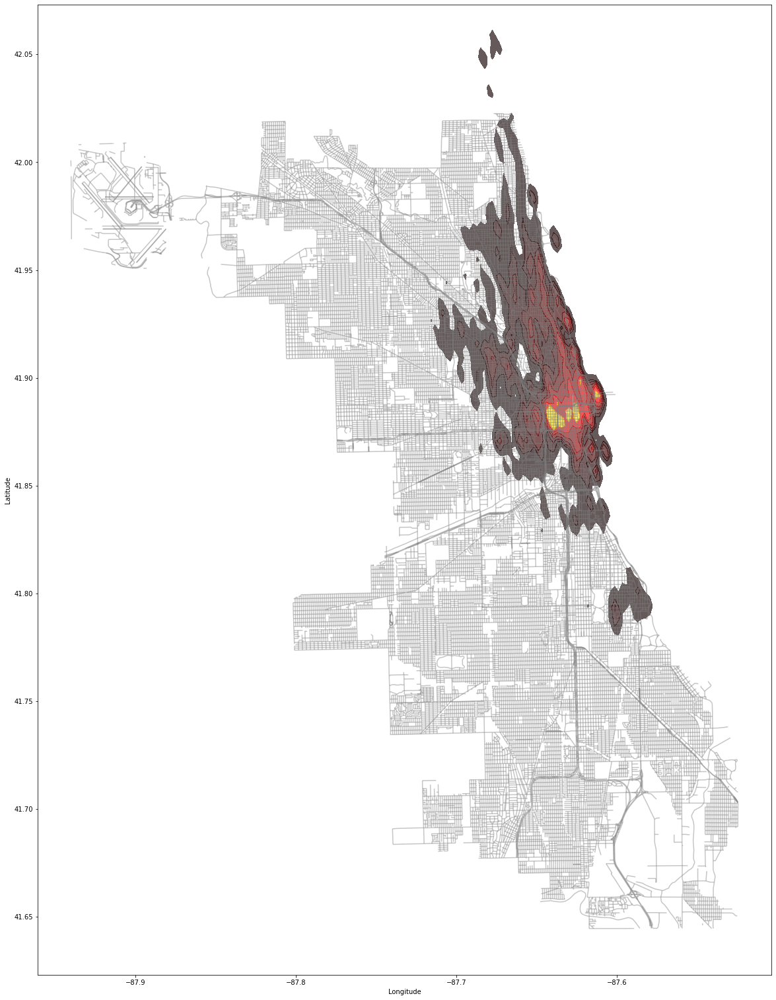

In [109]:
# plot heatmap of dataset on streets
fig, ax = plt.subplots(figsize = (40,27))
streets.plot(ax = ax, alpha=0.45, color= 'grey')
sns.kdeplot(ax = ax,
            data = heatmap_df,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 8,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

In [110]:
# over 250 station ids seem to not have been used once as starting point
stations['ID'].nunique() - chicago_data['start_station_id'].nunique()
# is it worth funding these stations? (However we dont know how many are still active, because old data)

250

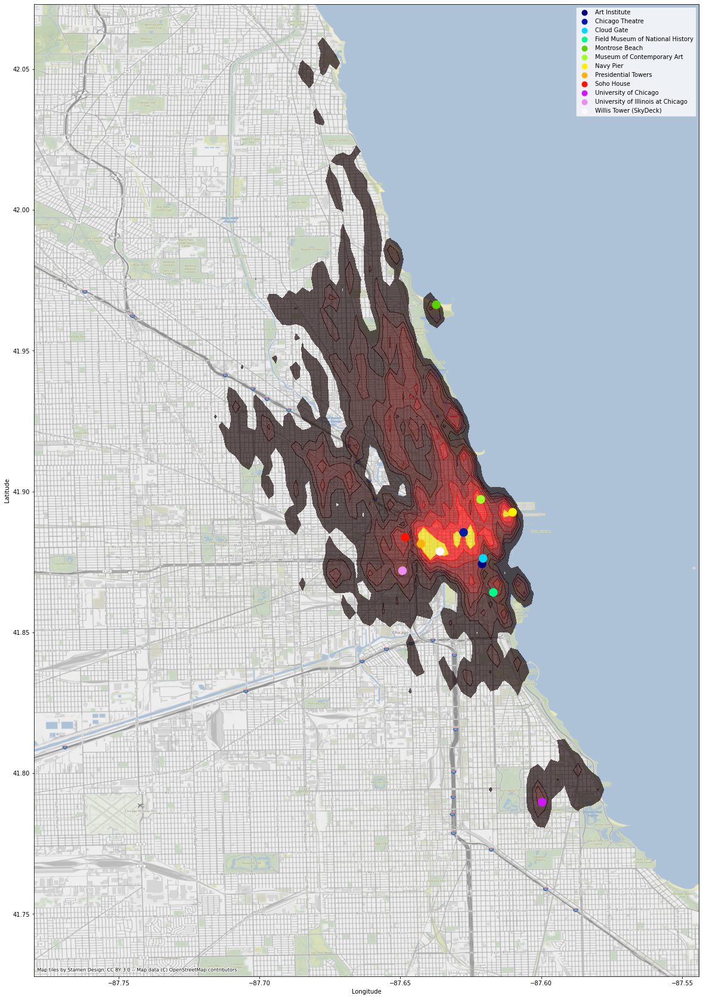

In [112]:
#find coordinates of attractions
attractions = [{'Name': 'Navy Pier',
                "Longitude" :-87.610168,
                "Latitude":41.892654}, #Navy Pier
               {'Name': 'University of Chicago',
                "Longitude" :-87.599724,
                "Latitude":41.789722}, #University of Chicago
               {'Name': 'University of Illinois at Chicago',
                "Longitude":-87.64925,
                'Latitude': 41.871889},#University of Illinois at Chicago
               {'Name': 'Soho House',
                "Longitude": -87.648307,
                'Latitude': 41.88374},#Soho House
               {'Name': 'Presidential Towers',
                "Longitude": -87.6426838,
                'Latitude': 41.8814362},#Presidential Towers
               {'Name': 'Chicago Theatre',
                "Longitude": -87.627569,
                'Latitude': 41.885485},# Chicago Theatre
               {'Name': 'Art Institute',
                "Longitude": -87.620997516,
                'Latitude': 41.874329836},# Art Institute
                {'Name': 'Montrose Beach',
                "Longitude": -87.637233,
                'Latitude': 41.966331},#Montrose Beach
               {'Name': 'Field Museum of National History',
                "Longitude": -87.617020,
                'Latitude': 41.864193},#Field Museum of National History
               {'Name': 'Museum of Contemporary Art',
                "Longitude": -87.621474,
                'Latitude': 41.897215 },#Museum of Contemporary Art
               {'Name': 'Cloud Gate',
                "Longitude": -87.620659184,
                'Latitude': 41.8762748282 },#Cloud Gate
               {'Name': 'Willis Tower (SkyDeck)',
                "Longitude": -87.635943,
                'Latitude': 41.878741}]#Willis Tower (SkyDeck)



# load into dataframe
attractions1 = pd.DataFrame(attractions, index = [1,2,3,4,5,6,7,8,9,10,11,12])

#calculate Point data for attractions
geometry_attrac = [Point (xy) for xy in zip(attractions1['Longitude'], attractions1['Latitude'])]

#create Geodataframe 
attrac = gpd.GeoDataFrame(attractions1, crs={"init":"epsg:4326"}, geometry = geometry_attrac)

#plot
fig, ax = plt.subplots(figsize = (50,30))

attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_df,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [113]:
# lets merge dataframes on Divvy station Id and end
chicago_geo_end_st = pd.merge(chicago_data,stations_geo,left_on=['end_station_id'], right_on = ['ID'], how = 'left')

In [114]:
#4864 NaN rows remain, lets drop them
chicago_geo_end_st.isna().sum()

start_time               0
end_time                 0
start_station_id         0
end_station_id           0
start_station_name       0
end_station_name         0
bike_id                  0
user_type                0
start                    0
end                      0
time_rounded             0
weekday                  0
week                     0
month                    0
day_of_month             0
hour_of_day              0
trip_duration            0
date                     0
trips_per_hour           0
ID                    4864
Station Name          4864
Total Docks           4864
Docks in Service      4864
Status                4864
Latitude              4864
Longitude             4864
Location              4864
geometry              4864
dtype: int64

In [115]:
chicago_geo_end_st = chicago_geo_end_st.dropna(axis=0, how="any")

In [116]:
heatmap_df_end = chicago_geo_end_st[['Longitude', 'Latitude']]

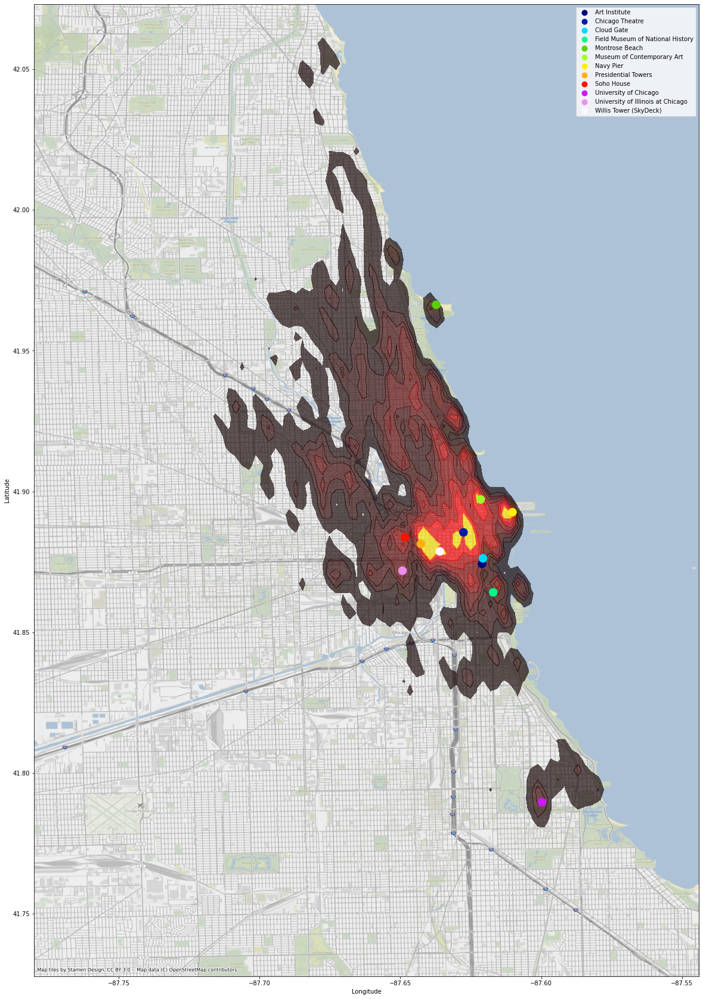

In [117]:
#iterate step for end stations
# minimal differences between start and end heatmaps can be observed

#plot
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')


# 
sns.kdeplot(ax = ax,
            data = heatmap_df_end,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [ ]:
heatmap_workdays = chicago_geo[chicago_geo.weekday.isin([0,1,2,3,4])]
heatmap_weekend = chicago_geo[chicago_geo.weekday.isin([5,6])]

In [ ]:
#plot workdays heatmap
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_workdays,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [ ]:
#plot weekend heatmap
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_weekend,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

## Key Performance Indicators

##### KPI1 => Average trip duration per day
Our first KPI is the average trip duration per day as we assume that this will differ in the year

Text(0.5, 0.98, 'trip duration per day (mean)')

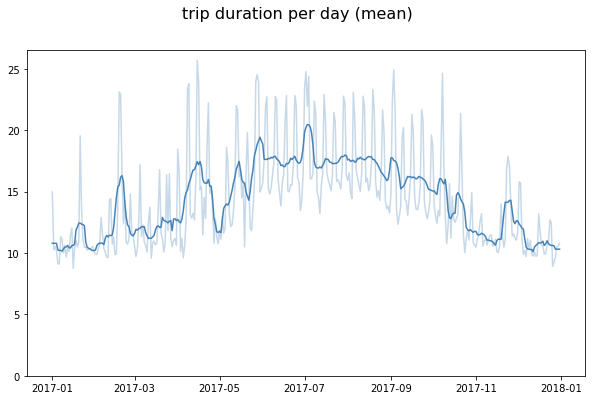

In [18]:
kpi_01 = chicago_data.groupby(['date']).agg(
        rental_count=("start_time","count"),
        mean_trip_duration=("trip_duration_minutes","mean")
)

kpi_01['mean_trip_duration_ma'] = moving_average(kpi_01["mean_trip_duration"],7)
kpi_01['rental_count_ma'] = moving_average(kpi_01["rental_count"],7)

fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_01.index, kpi_01['mean_trip_duration'],c="steelblue",alpha = 0.3)
axis.plot(kpi_01.index, kpi_01['mean_trip_duration_ma'],c="steelblue")

axis.set_ylim(bottom=0)
fig.suptitle("trip duration per day (mean)", fontsize=16)

#### KPI2 => Rentals per day 

Text(0.5, 0.98, 'Rentals per day')

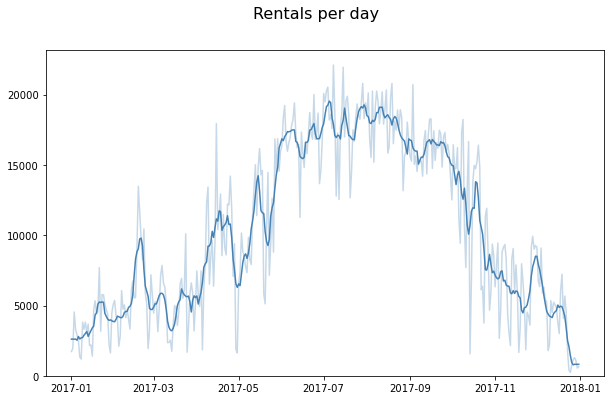

In [19]:
fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_01.index, kpi_01['rental_count'],c="steelblue",alpha = 0.3)
axis.plot(kpi_01.index, kpi_01['rental_count_ma'],c="steelblue")

axis.set_ylim(bottom=0)
fig.suptitle("Rentals per day", fontsize=16)

#### KPI3 => total rentals per station
As fleet manager we want to know which stations creates the most revenue.

Text(0.5, 0.98, 'total rentals per station')

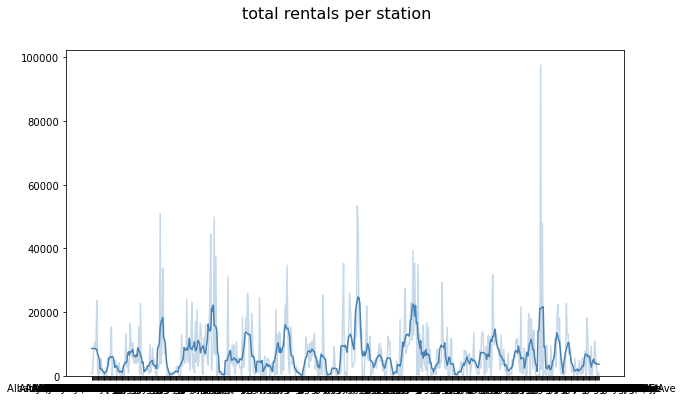

In [20]:
kpi_02 = chicago_data.groupby(['start_station_name']).agg(
        rental_count=("start_time","count")
)

kpi_02['rental_count_ma'] = moving_average(kpi_02["rental_count"],7)

fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_02.index, kpi_02['rental_count'],c="steelblue",alpha = 0.3)
axis.plot(kpi_02.index, kpi_02['rental_count_ma'],c="steelblue")

axis.set_ylim(bottom=0)
fig.suptitle("total rentals per station", fontsize=16)

#### KPI4 => Available bikes in the fleet 

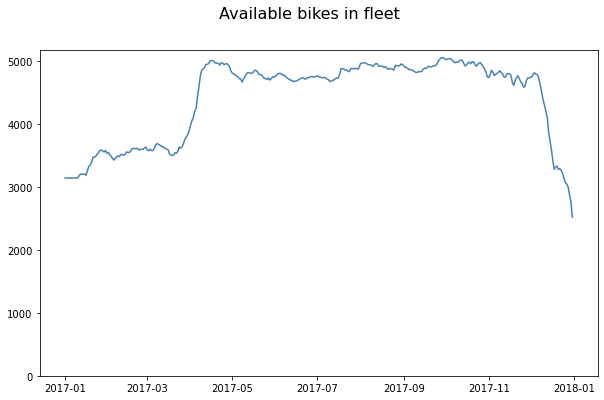

In [21]:
fig,axis = plt.subplots(1,1,figsize=(10,6))

_=axis.plot(fleet_size.index,(fleet_size["fleet_size"]),c="steelblue")

axis.set_ylim(bottom=0)
_=fig.suptitle("Available bikes in fleet", fontsize=16)

#### KPI5 => Customer types per day
As we have subscriber and customers as a renter type we want to know how much rentals will done per day from which renter type.

Text(0.5, 0.98, 'Customer types per day')

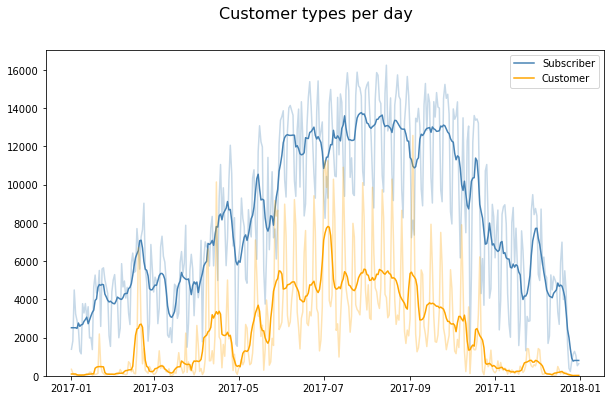

In [23]:
kpi_05_sub = chicago_data[chicago_data['user_type']=='Subscriber'].groupby(['date']).agg(
        rental_count=("start_time","count")
)
kpi_05_cus = chicago_data[chicago_data['user_type']=='Customer'].groupby(['date']).agg(
        rental_count=("start_time","count")
)

kpi_05_sub['rental_count_ma'] = moving_average(kpi_05_sub["rental_count"],7)
kpi_05_cus['rental_count_ma'] = moving_average(kpi_05_cus["rental_count"],7)

fig,axis = plt.subplots(1,1,figsize=(10,6))

axis.plot(kpi_05_sub.index, kpi_05_sub['rental_count'],c="steelblue",alpha = 0.3)
axis.plot(kpi_05_sub.index, kpi_05_sub['rental_count_ma'],c="steelblue", label="Subscriber")

axis.plot(kpi_05_cus.index, kpi_05_cus['rental_count'],c="orange",alpha = 0.3)
axis.plot(kpi_05_cus.index, kpi_05_cus['rental_count_ma'],c="orange", label="Customer")

axis.set_ylim(bottom=0)
axis.legend()
fig.suptitle("Customer types per day", fontsize=16)

#### KPI 6 

In [243]:
#convert columns to datetimes and shift startTime per groups 
time_betw_rides['start_time'] = pd.to_datetime(time_betw_rides['start_time']).groupby(level=0).shift(-1)
time_betw_rides['end_time'] = pd.to_datetime(time_betw_rides['end_time'])



In [244]:
#subtract, remove first missing values per groups and set column from index
time_betw_rides = time_betw_rides['start'].sub(time_betw_rides['end']).dropna().reset_index(name='time')


In [245]:
time_betw_rides.head()

,bike_id,time
0,5292,-1 days +23:46:00
1,4408,-1 days +23:56:00
2,696,-1 days +23:54:00
3,4915,-1 days +23:55:00
4,4247,-1 days +23:53:00


In [118]:
# To calculate revenue, take a look at Divvys pricing (https://www.divvybikes.com/pricing)

#For customers: (Single Ride, $3.30/trip, One trip up to 30 minutes)
chicago_data['revenue'] = np.ceil((chicago_data.trip_duration.dt.total_seconds()/60) /30) * 3.3
#For subscribers:(annaual membership, 9$/month, Unlimited 45-min rides)
#assuming every subscription is first login


In [ ]:
#add subscriber pricing

In [119]:
daily_rev = chicago_data.groupby('date').agg(daily_revenue=("revenue","sum"))
daily_rev_per_bike = daily_rev/chicago_data['bike_id'].nunique()
#fleet_size needs to be calculated differently

Text(0, 0.5, 'daily revenue (in $) per bike')

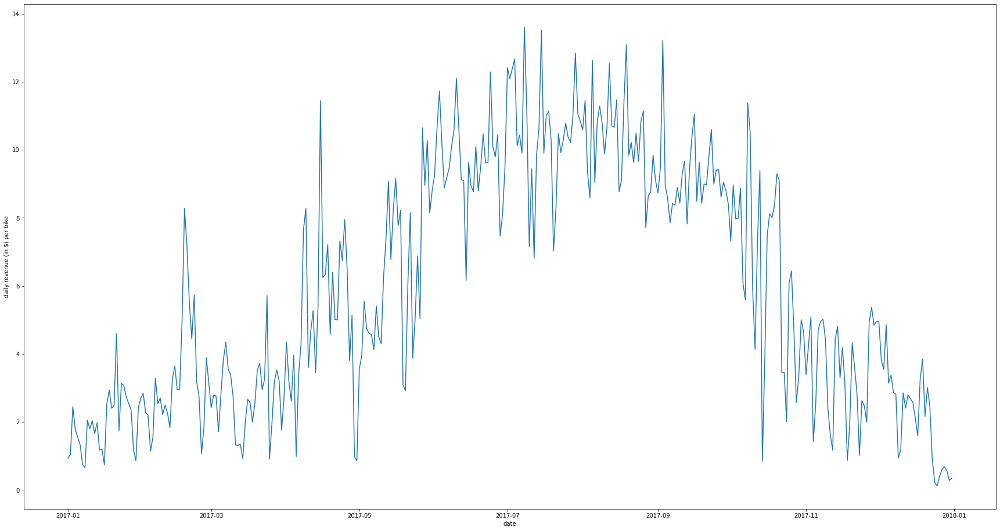

In [120]:
#revenue per bike
plt.figure(figsize=(30,16))
plt.plot(daily_rev_per_bike)
plt.xlabel('date')
plt.ylabel('daily revenue (in $) per bike')

# Cluster Analysis

## Geographical based Clustering

In [ ]:
#Advantages of Customer Segmentation:
#Determine appropriate product pricing.
#Develop customized marketing campaigns.
#Design an optimal distribution strategy.
#Choose specific product features for deployment.
#Prioritize new product development efforts.

In [ ]:
#based on the bike rental demnad patterns (high weekday demand, peak demand dat specific times of day, seasonality) found earlier, we try to find clusters of trip/customer types

In [273]:
chicago_geo.sort_values(by=['start_time'], inplace=True)

In [274]:
chicago_geo.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,revenue,ID_x,Station Name_x,Total Docks_x,Docks in Service_x,Status_x,Latitude_x,Longitude_x,Location_x,geometry_x,ID_y,Station Name_y,Total Docks_y,Docks in Service_y,Status_y,Latitude_y,Longitude_y,Location_y,geometry_y
423537,1/1/2017 00:00:36,1/1/2017 00:06:32,414,191,Canal St & Taylor St,Canal St & Monroe St (*),2511,Customer,2017-01-01 00:00:00,2017-01-01 00:06:00,2017-01-01,6,52,1,1,0,0 days 00:06:00,2017-01-01,45,3.3,414.0,Canal St & Taylor St,15.0,15.0,In Service,41.870257,-87.639474,"(41.870257, -87.639474)",POINT (-87.63947 41.87026),191.0,Canal St & Monroe St,27.0,27.0,In Service,41.881690,-87.639530,"(41.88169, -87.63953)",POINT (-87.63953 41.88169)
423536,1/1/2017 00:02:54,1/1/2017 00:08:21,28,20,Larrabee St & Menomonee St,Sheffield Ave & Kingsbury St,3660,Subscriber,2017-01-01 00:02:00,2017-01-01 00:08:00,2017-01-01,6,52,1,1,0,0 days 00:06:00,2017-01-01,45,3.3,28.0,Larrabee St & Menomonee St,15.0,15.0,In Service,41.914680,-87.643320,"(41.91468, -87.64332)",POINT (-87.64332 41.91468),20.0,Sheffield Ave & Kingsbury St,15.0,15.0,In Service,41.910522,-87.653106,"(41.910522, -87.653106)",POINT (-87.65311 41.91052)
423535,1/1/2017 00:06:06,1/1/2017 00:18:31,620,333,Orleans St & Chestnut St (NEXT Apts),Ashland Ave & Blackhawk St,4992,Subscriber,2017-01-01 00:06:00,2017-01-01 00:18:00,2017-01-01,6,52,1,1,0,0 days 00:12:00,2017-01-01,45,3.3,620.0,Orleans St & Chestnut St (NEXT Apts),15.0,15.0,In Service,41.898203,-87.637536,"(41.898203, -87.637536)",POINT (-87.63754 41.89820),333.0,Ashland Ave & Blackhawk St,15.0,15.0,In Service,41.907066,-87.667252,"(41.907066, -87.667252)",POINT (-87.66725 41.90707)
423534,1/1/2017 00:07:28,1/1/2017 00:12:51,287,68,Franklin St & Monroe St,Clinton St & Tilden St,5637,Subscriber,2017-01-01 00:07:00,2017-01-01 00:12:00,2017-01-01,6,52,1,1,0,0 days 00:05:00,2017-01-01,45,3.3,287.0,Franklin St & Monroe St,31.0,31.0,In Service,41.880317,-87.635185,"(41.880317, -87.635185)",POINT (-87.63518 41.88032),68.0,Clinton St & Tilden St,23.0,23.0,In Service,41.875885,-87.640795,"(41.875885, -87.640795)",POINT (-87.64079 41.87588)
423533,1/1/2017 00:07:57,1/1/2017 00:20:53,300,118,Broadway & Barry Ave,Sedgwick St & North Ave,2209,Subscriber,2017-01-01 00:07:00,2017-01-01 00:20:00,2017-01-01,6,52,1,1,0,0 days 00:13:00,2017-01-01,45,3.3,300.0,Broadway & Barry Ave,19.0,19.0,In Service,41.937582,-87.644098,"(41.93758231600629, -87.6440978050232)",POINT (-87.64410 41.93758),118.0,Sedgwick St & North Ave,19.0,19.0,In Service,41.911386,-87.638677,"(41.911386, -87.638677)",POINT (-87.63868 41.91139)


In [ ]:
#add distance travelled

In [281]:
def distancer(row):
    coords_1 = (row['Latitude_x'], row['Longitude_x'])
    coords_2 = (row['Latitude_y'], row['Longitude_y'])
    return geopy.distance.distance(coords_1, coords_2).km

chicago_geo['distance_travelled'] = chicago_geo.apply(distancer, axis=1)

In [282]:
chicago_geo.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,revenue,ID_x,Station Name_x,Total Docks_x,Docks in Service_x,Status_x,Latitude_x,Longitude_x,Location_x,geometry_x,ID_y,Station Name_y,Total Docks_y,Docks in Service_y,Status_y,Latitude_y,Longitude_y,Location_y,geometry_y,distance_travelled
423537,1/1/2017 00:00:36,1/1/2017 00:06:32,414,191,Canal St & Taylor St,Canal St & Monroe St (*),2511,Customer,2017-01-01 00:00:00,2017-01-01 00:06:00,2017-01-01,6,52,1,1,0,0 days 00:06:00,2017-01-01,45,3.3,414.0,Canal St & Taylor St,15.0,15.0,In Service,41.870257,-87.639474,"(41.870257, -87.639474)",POINT (-87.63947 41.87026),191.0,Canal St & Monroe St,27.0,27.0,In Service,41.881690,-87.639530,"(41.88169, -87.63953)",POINT (-87.63953 41.88169),1.269882
423536,1/1/2017 00:02:54,1/1/2017 00:08:21,28,20,Larrabee St & Menomonee St,Sheffield Ave & Kingsbury St,3660,Subscriber,2017-01-01 00:02:00,2017-01-01 00:08:00,2017-01-01,6,52,1,1,0,0 days 00:06:00,2017-01-01,45,3.3,28.0,Larrabee St & Menomonee St,15.0,15.0,In Service,41.914680,-87.643320,"(41.91468, -87.64332)",POINT (-87.64332 41.91468),20.0,Sheffield Ave & Kingsbury St,15.0,15.0,In Service,41.910522,-87.653106,"(41.910522, -87.653106)",POINT (-87.65311 41.91052),0.934051
423535,1/1/2017 00:06:06,1/1/2017 00:18:31,620,333,Orleans St & Chestnut St (NEXT Apts),Ashland Ave & Blackhawk St,4992,Subscriber,2017-01-01 00:06:00,2017-01-01 00:18:00,2017-01-01,6,52,1,1,0,0 days 00:12:00,2017-01-01,45,3.3,620.0,Orleans St & Chestnut St (NEXT Apts),15.0,15.0,In Service,41.898203,-87.637536,"(41.898203, -87.637536)",POINT (-87.63754 41.89820),333.0,Ashland Ave & Blackhawk St,15.0,15.0,In Service,41.907066,-87.667252,"(41.907066, -87.667252)",POINT (-87.66725 41.90707),2.654992
423534,1/1/2017 00:07:28,1/1/2017 00:12:51,287,68,Franklin St & Monroe St,Clinton St & Tilden St,5637,Subscriber,2017-01-01 00:07:00,2017-01-01 00:12:00,2017-01-01,6,52,1,1,0,0 days 00:05:00,2017-01-01,45,3.3,287.0,Franklin St & Monroe St,31.0,31.0,In Service,41.880317,-87.635185,"(41.880317, -87.635185)",POINT (-87.63518 41.88032),68.0,Clinton St & Tilden St,23.0,23.0,In Service,41.875885,-87.640795,"(41.875885, -87.640795)",POINT (-87.64079 41.87588),0.677630
423533,1/1/2017 00:07:57,1/1/2017 00:20:53,300,118,Broadway & Barry Ave,Sedgwick St & North Ave,2209,Subscriber,2017-01-01 00:07:00,2017-01-01 00:20:00,2017-01-01,6,52,1,1,0,0 days 00:13:00,2017-01-01,45,3.3,300.0,Broadway & Barry Ave,19.0,19.0,In Service,41.937582,-87.644098,"(41.93758231600629, -87.6440978050232)",POINT (-87.64410 41.93758),118.0,Sedgwick St & North Ave,19.0,19.0,In Service,41.911386,-87.638677,"(41.911386, -87.638677)",POINT (-87.63868 41.91139),2.944211


In [ ]:
#trip types
#by duration(speed=duration/distance) and distance and time of day

In [541]:
#create df
cluster_1 = chicago_geo[['trip_duration', 'distance_travelled', 'weekday']]
#change timedelta to int
cluster_1['trip_duration'] = cluster_1['trip_duration'].dt.seconds/60
#set 500 minute max trip lenth threshold
cluster_1['trip_duration'] = cluster_1[cluster_1['trip_duration'] <500]

In [542]:
cluster_1.head()

,trip_duration,distance_travelled,weekday
423537,6.0,1.269882,6
423536,6.0,0.934051,6
423535,12.0,2.654992,6
423534,5.0,0.677630,6
423533,13.0,2.944211,6


In [515]:
#select workdays
cluster_1 = cluster_1[cluster_1.weekday.isin([0,1,2,3,4])]

In [516]:
cluster_1.drop('weekday', axis=1, inplace=True)
cluster_1.dropna(inplace=True)

In [517]:
#Scale data
st_scaler.fit(cluster_1)
scaled_cluster = st_scaler.transform(cluster_1)

In [385]:
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)

Text(0, 0.5, 'SSE')

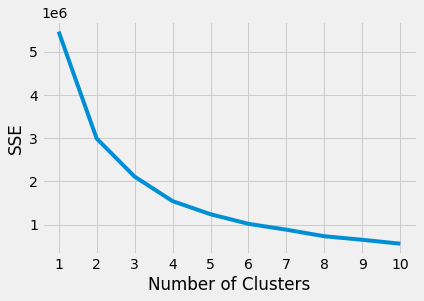

In [386]:
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

In [390]:
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

Text(0.5, 0, 'trip duration')

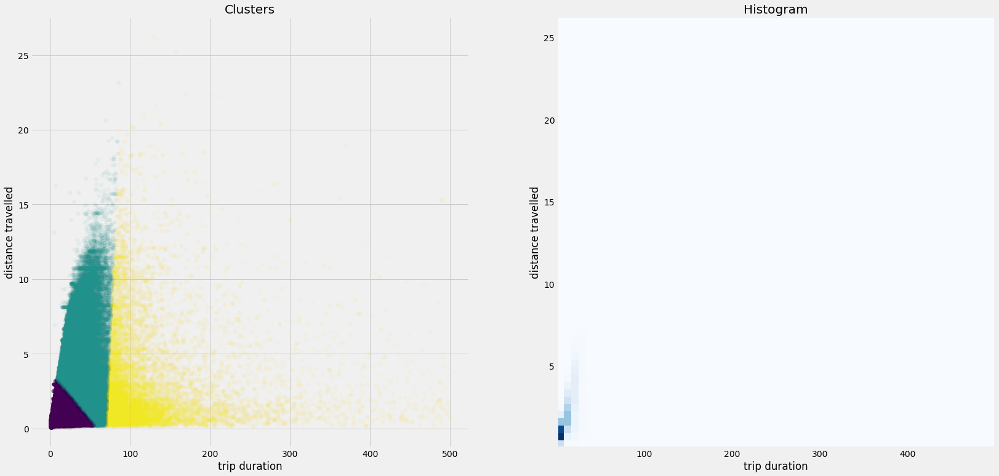

In [391]:
fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_1['trip_duration'],y=cluster_1['distance_travelled'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_1['trip_duration'],
            cluster_1['distance_travelled'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('distance travelled')
ax[0].set_xlabel('trip duration')


ax[1].set_ylabel("distance travelled")
ax[1].set_xlabel("trip duration")

(0.0, 100.0)

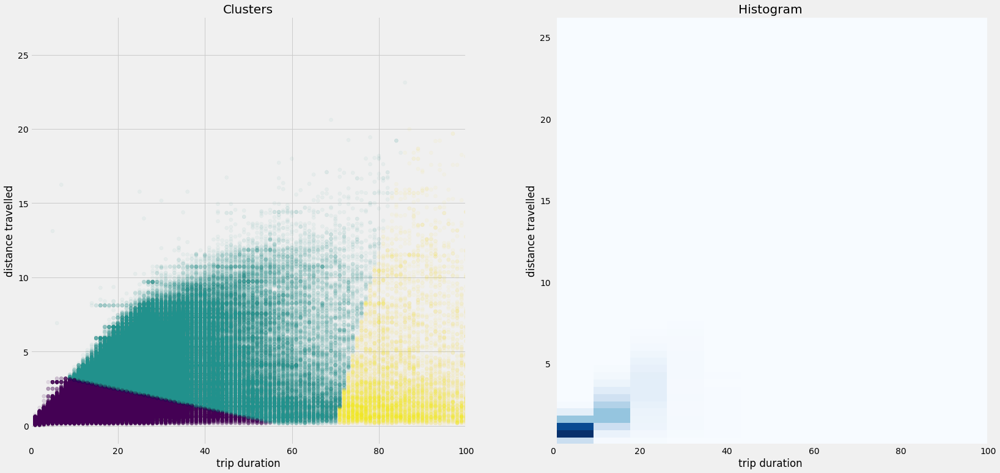

In [392]:
fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_1['trip_duration'],y=cluster_1['distance_travelled'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_1['trip_duration'],
            cluster_1['distance_travelled'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('distance travelled')
ax[0].set_xlabel('trip duration')
ax[0].set_xlim(0,100)

ax[1].set_ylabel("distance travelled")
ax[1].set_xlabel("trip duration")
ax[1].set_xlim(0,100)

In [ ]:
#trip distance vs timeofday

In [492]:
cluster_2 = chicago_geo[['start', 'distance_travelled','weekday']]

cluster_2['start'] = cluster_2['start'].dt.time
cluster_2['start'] = cluster_2['start'].astype(str)

cluster_2['start'] = pd.to_timedelta(cluster_2['start']).dt.total_seconds()
cluster_2['start'] = cluster_2['start']/60/60

In [493]:
#select workdays
cluster_2 = cluster_2[cluster_2.weekday.isin([0,1,2,3,4])]

In [494]:
#set 500 minute max trip lenth threshold

cluster_2.drop('weekday', axis=1, inplace=True)
cluster_2.dropna(inplace=True)


Text(0.5, 0, 'time')

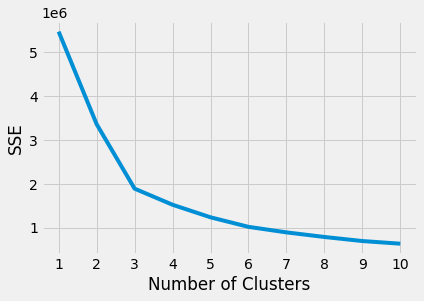

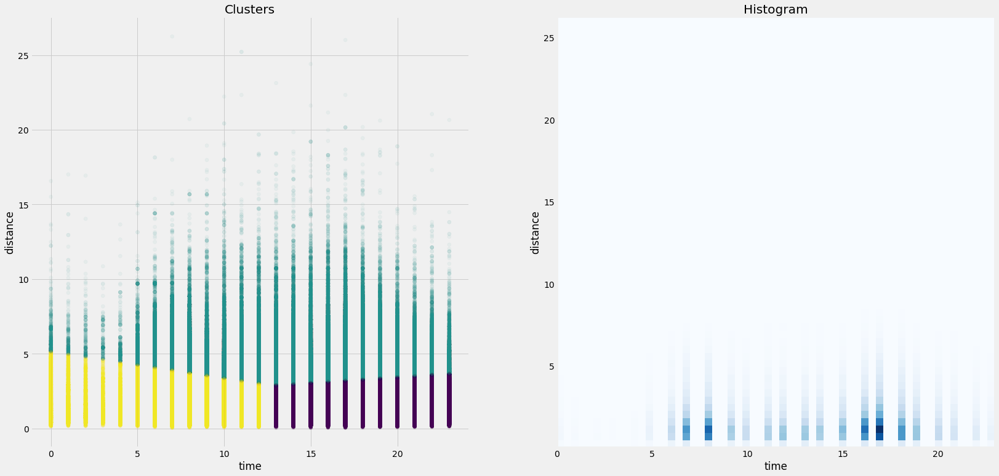

In [495]:
#Scale data
st_scaler.fit(cluster_2)
scaled_cluster = st_scaler.transform(cluster_2)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

#initiate
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_2['hour_of_day'],y=cluster_2['distance_travelled'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_2['hour_of_day'],
            cluster_2['distance_travelled'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('distance')
ax[0].set_xlabel('time')


ax[1].set_ylabel("distance")
ax[1].set_xlabel("time")

In [702]:
#create df
cluster_3 = chicago_geo[['trip_duration', 'start', 'weekday']]
#change timedelta to int
cluster_3['trip_duration'] = cluster_3['trip_duration'].dt.seconds/60
#set 500 minute max trip lenth threshold
cluster_3['trip_duration'] = cluster_3[cluster_3['trip_duration'] < 500]

In [703]:
#select workdays
cluster_3 = cluster_3[cluster_3.weekday.isin([0,1,2,3,4])]

In [704]:
cluster_3.drop('weekday', axis=1, inplace=True)
cluster_3.dropna(inplace=True)

In [708]:
cluster_3['start'] = cluster_3['start'].dt.time
cluster_3['start'] = cluster_3['start'].astype(str)

cluster_3['start'] = pd.to_timedelta(cluster_3['start']).dt.total_seconds()
cluster_3['start'] = cluster_3['start']/60/60

In [699]:
cluster_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2732862 entries, 400589 to 1849900
Data columns (total 2 columns):
 #   Column         Dtype  
---  ------         -----  
 0   trip_duration  object 
 1   start          float64
dtypes: float64(1), object(1)
memory usage: 62.6+ MB


In [709]:
#set 500 minute max trip length threshold
cluster_3.tail()

,trip_duration,start
1849904,2,23.950000
1849903,8,23.950000
1849902,5,23.966667
1849901,14,23.966667
1849900,7,23.983333


Text(0.5, 0, 'start time')

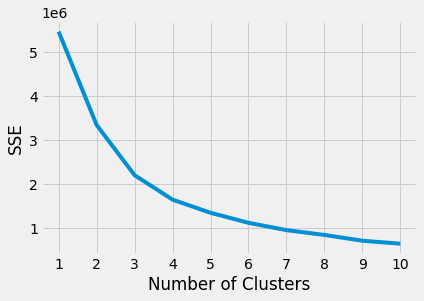

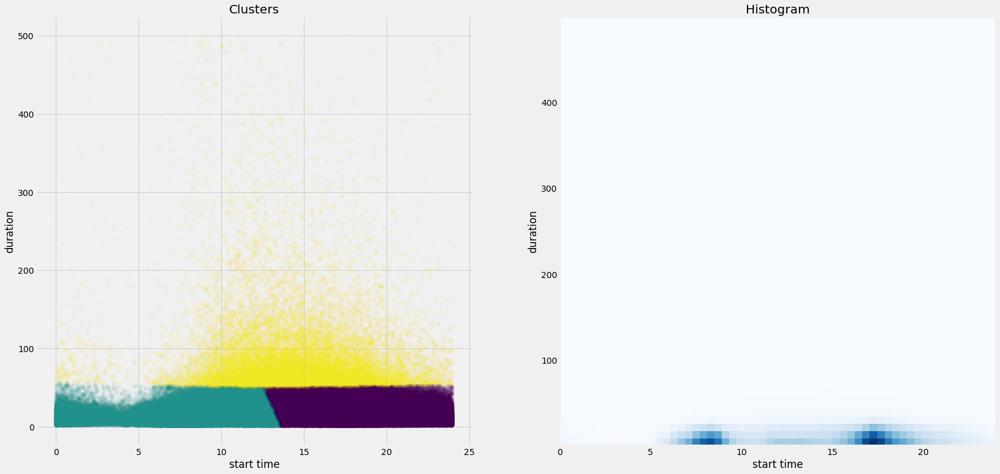

In [710]:
#Scale data
st_scaler.fit(cluster_3)
scaled_cluster = st_scaler.transform(cluster_3)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

#initiate
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)

fig,ax=plt.subplots(1,2,figsize=(25,12))

ax[0].scatter(x=cluster_3['start'],y=cluster_3['trip_duration'],c=labels,alpha=0.05)

ax[1].hist2d(cluster_3['start'],
            cluster_3['trip_duration'],
            bins=59, cmap="Blues")

ax[0].set_title("Clusters")
ax[1].set_title("Histogram")

ax[0].set_ylabel('duration')
ax[0].set_xlabel('start time')


ax[1].set_ylabel("duration")
ax[1].set_xlabel("start time")

In [733]:
cluster_4 = chicago_geo[['trip_duration', 'start', 'distance_travelled', 'weekday']]
#change timedelta to int
cluster_4['trip_duration'] = cluster_4['trip_duration'].dt.seconds/60
#set 500 minute max trip lenth threshold
cluster_4['trip_duration'] = cluster_4[cluster_4['trip_duration'] < 500]


#select workdays
cluster_4 = cluster_4[cluster_4.weekday.isin([0,1,2,3,4])]

cluster_4.drop('weekday', axis=1, inplace=True)

cluster_4.dropna(inplace=True)

cluster_4['start'] = cluster_4['start'].dt.time
cluster_4['start'] = cluster_4['start'].astype(str)

cluster_4['start'] = pd.to_timedelta(cluster_4['start']).dt.total_seconds()
cluster_4['start'] = cluster_4['start']/60/60

In [1]:
#Scale data
st_scaler.fit(cluster_4)
scaled_cluster = st_scaler.transform(cluster_4)

#args
kmeans_kwargs = {
            "init": "random",
            "n_init": 10,
            "max_iter": 300,
            "random_state": 42,
             }
# A list holds the SSE values for each k
sse = []
#test different k values and record sse
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_cluster)
    sse.append(kmeans.inertia_)
    
#plot sse
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")

NameError: name 'st_scaler' is not defined

In [ ]:
# finding the clusters based on input matrix
kmeans = KMeans(n_clusters=3)
labels = kmeans.fit_predict(scaled_cluster)


In [ ]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(cluster_4['start'],cluster_4['trip_duration'],cluster_4['distance_travelled'],c=labels, s=20, alpha=0.05)
#ax.scatter(cluster_4[labels == 0,0],cluster_4[labels == 0,1],cluster_4[labels == 0,2], s = 20 , color = 'blue', label = 'trip type 1')
#ax.scatter(cluster_4[labels == 1,0],cluster_4[labels == 1,1],cluster_4[labels == 1,2], s = 20 , color = 'orange', label = 'trip type 2')
#ax.scatter(cluster_4[labels == 2,0],cluster_4[labels == 2,1],cluster_4[labels == 2,2], s = 20 , color = 'green', label = 'trip type 3')

ax.set_xlabel('start')
ax.set_ylabel('duration')
ax.set_zlabel('distance')
ax.view_init(0, 60)
ax.legend()

In [ ]:
#Trip Type 1:Long distance trips with relatively medium to high speed. No specific characteristic of departure time.
#Trip type 2 (in green): Evening short trips with relatively low speed.
#Trip type 3 (in blue): Morning short trips with relatively low speed.

In [ ]:
#merge datasets on datetime64 time columns
chicago_final = pd.merge(filtered_df,weather_data,left_on=['time_rounded'], right_on = ['index'], how = 'left')

In [125]:
chicago_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype          
---  ------              --------------  -----          
 0   time_rounded        8760 non-null   datetime64[ns] 
 1   start_time          8742 non-null   object         
 2   end_time            8742 non-null   object         
 3   start_station_id    8742 non-null   float64        
 4   end_station_id      8742 non-null   float64        
 5   start_station_name  8742 non-null   object         
 6   end_station_name    8742 non-null   object         
 7   bike_id             8742 non-null   float64        
 8   user_type           8742 non-null   object         
 9   start               8742 non-null   datetime64[ns] 
 10  end                 8742 non-null   datetime64[ns] 
 11  weekday             8760 non-null   float64        
 12  week                8760 non-null   UInt32         
 13  month               8760 non-null

In [126]:
# NaNs in columns! (because we couldn't impute geodata or station names)
chicago_final.isna().sum()

time_rounded           0
start_time            18
end_time              18
start_station_id      18
end_station_id        18
start_station_name    18
end_station_name      18
bike_id               18
user_type             18
start                 18
end                   18
weekday                0
week                   0
month                  0
day_of_month           0
hour_of_day            0
trip_duration         18
date                   0
trips_per_hour         0
index                  0
max_temp               0
min_temp               0
precip                 0
dtype: int64

In [ ]:
chicago_final = chicago_final.dropna(axis=0, how="any")

<AxesSubplot:>

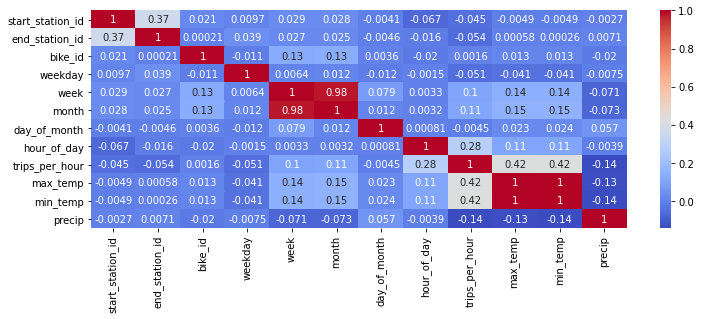

In [127]:
##Feature Engeneering
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

In [128]:
#add weekday dummy
weekday = chicago_final['weekday'] <= 4

chicago_final.loc[:,"IsWeekday"] = weekday

In [129]:
chicago_final.head()

,time_rounded,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,index,max_temp,min_temp,precip,IsWeekday
0,2017-01-01 00:00:00,1/1/2017 00:56:09,1/1/2017 01:10:51,26.0,90.0,McClurg Ct & Illinois St,Millennium Park,3810.0,Customer,2017-01-01 00:56:00,2017-01-01 01:10:00,6.0,52,1.0,1.0,0.0,0 days 00:14:00,2017-01-01,45.0,2017-01-01 00:00:00,-0.6,-0.6,0.0,False
1,2017-01-01 01:00:00,1/1/2017 01:59:00,1/1/2017 02:16:04,228.0,325.0,Damen Ave & Melrose Ave,Clark St & Winnemac Ave,1321.0,Subscriber,2017-01-01 01:59:00,2017-01-01 02:16:00,6.0,52,1.0,1.0,1.0,0 days 00:17:00,2017-01-01,45.0,2017-01-01 01:00:00,-2.2,-2.2,0.0,False
2,2017-01-01 02:00:00,1/1/2017 02:59:42,1/1/2017 03:02:13,256.0,312.0,Broadway & Sheridan Rd,Clarendon Ave & Gordon Ter,3937.0,Subscriber,2017-01-01 02:59:00,2017-01-01 03:02:00,6.0,52,1.0,1.0,2.0,0 days 00:03:00,2017-01-01,34.0,2017-01-01 02:00:00,-2.8,-2.8,0.0,False
3,2017-01-01 03:00:00,1/1/2017 03:55:01,1/1/2017 04:06:21,141.0,349.0,Clark St & Lincoln Ave,Halsted St & Wrightwood Ave,1211.0,Subscriber,2017-01-01 03:55:00,2017-01-01 04:06:00,6.0,52,1.0,1.0,3.0,0 days 00:11:00,2017-01-01,18.0,2017-01-01 03:00:00,-3.3,-3.3,0.0,False
4,2017-01-01 04:00:00,1/1/2017 04:52:59,1/1/2017 04:55:35,61.0,16.0,Wood St & Milwaukee Ave,Paulina Ave & North Ave,1758.0,Subscriber,2017-01-01 04:52:00,2017-01-01 04:55:00,6.0,52,1.0,1.0,4.0,0 days 00:03:00,2017-01-01,5.0,2017-01-01 04:00:00,-3.3,-3.3,0.0,False


In [130]:
# drop columns not needed for next steps
#as you can see, max and min temp per hour correlate by 1, so we delete min_temp also
chicago_final = chicago_final.drop(columns=['user_type','date','month','trip_duration','min_temp','start_time', 'end_time', 'start', 'end', 'start_station_id','start_station_name', 'end_station_id','end_station_name', 'bike_id', 'index'])

In [131]:
#final df
chicago_final.isna().sum()

time_rounded      0
weekday           0
week              0
day_of_month      0
hour_of_day       0
trips_per_hour    0
max_temp          0
precip            0
IsWeekday         0
dtype: int64

In [132]:
chicago_final.head(100)

,time_rounded,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,precip,IsWeekday
0,2017-01-01 00:00:00,6.0,52,1.0,0.0,45.0,-0.6,0.0,False
1,2017-01-01 01:00:00,6.0,52,1.0,1.0,45.0,-2.2,0.0,False
2,2017-01-01 02:00:00,6.0,52,1.0,2.0,34.0,-2.8,0.0,False
3,2017-01-01 03:00:00,6.0,52,1.0,3.0,18.0,-3.3,0.0,False
4,2017-01-01 04:00:00,6.0,52,1.0,4.0,5.0,-3.3,0.0,False
...,...,...,...,...,...,...,...,...,...
95,2017-01-04 23:00:00,2.0,1,4.0,23.0,13.0,-9.4,0.0,True
96,2017-01-05 00:00:00,3.0,1,5.0,0.0,10.0,-10.6,0.0,True
97,2017-01-05 01:00:00,3.0,1,5.0,1.0,1.0,-11.1,0.0,True
98,2017-01-05 02:00:00,3.0,1,5.0,2.0,2.0,-11.7,0.0,True


In [133]:
chicago_final[chicago_final.isna().any(axis=1)]

,time_rounded,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,precip,IsWeekday


In [134]:
chicago_final = chicago_final.set_index('time_rounded')
#sort by index 
chicago_final.sort_index(inplace=True)

In [135]:
chicago_final.head()

,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,precip,IsWeekday
time_rounded,,,,,,,,
2017-01-01 00:00:00,6.0,52,1.0,0.0,45.0,-0.6,0.0,False
2017-01-01 01:00:00,6.0,52,1.0,1.0,45.0,-2.2,0.0,False
2017-01-01 02:00:00,6.0,52,1.0,2.0,34.0,-2.8,0.0,False
2017-01-01 03:00:00,6.0,52,1.0,3.0,18.0,-3.3,0.0,False
2017-01-01 04:00:00,6.0,52,1.0,4.0,5.0,-3.3,0.0,False


<AxesSubplot:>

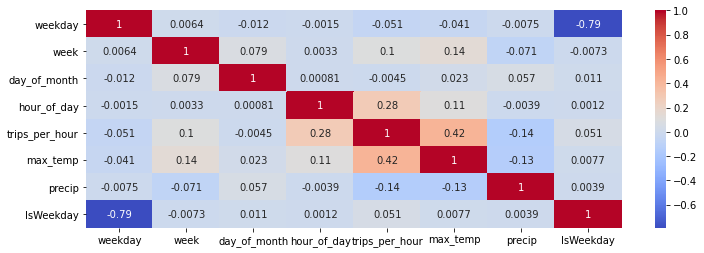

In [136]:
#check correlation again
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

In [137]:
#correct precip dummy 
chicago_final["precip"].unique()

array([0., 1.])

In [138]:
#get dummies for precip
chicago_final["precip_dummy"] = chicago_final["precip"].astype(int)
chicago_final = chicago_final.drop(columns=['precip'])

In [139]:
chicago_final.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-01-01 00:00:00 to 2017-12-31 23:00:00
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   weekday         8760 non-null   float64
 1   week            8760 non-null   UInt32 
 2   day_of_month    8760 non-null   float64
 3   hour_of_day     8760 non-null   float64
 4   trips_per_hour  8760 non-null   float64
 5   max_temp        8760 non-null   float64
 6   IsWeekday       8760 non-null   bool   
 7   precip_dummy    8760 non-null   int64  
dtypes: UInt32(1), bool(1), float64(5), int64(1)
memory usage: 530.4 KB


In [ ]:
##how to normalize?
#add holiday dummy

In [140]:
#Cross validation
X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)


In [81]:
X_test.head()

,weekday,week,day_of_month,hour_of_day,max_temp,IsWeekday,precip_dummy
time_rounded,,,,,,,
2019-10-26 06:00:00,5,43,26,6,3.3,False,0
2019-01-09 07:00:00,2,2,9,7,-5.0,True,0
2015-12-20 00:00:00,6,51,20,0,-2.8,False,0
2016-08-20 22:00:00,5,33,20,22,25.0,False,0
2017-11-15 09:00:00,2,46,15,9,8.3,True,1


(-100.0, 3079.6)

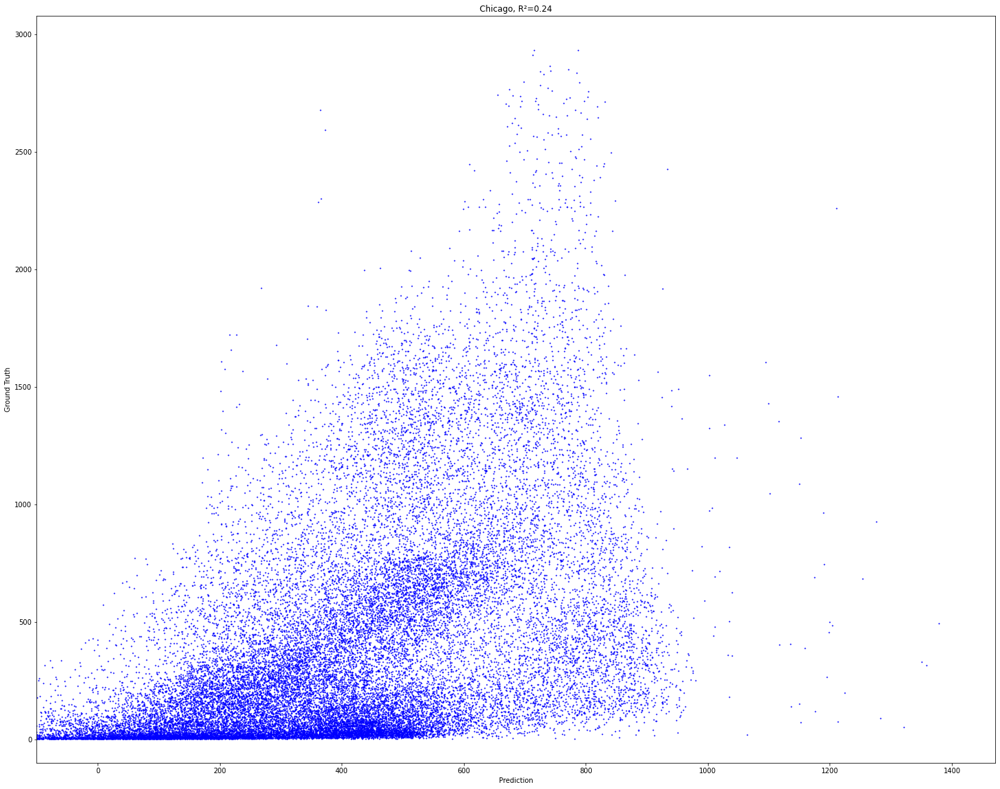

In [82]:
##multiple linear regression


lin_reg = LinearRegression(fit_intercept=True)
lin_reg.fit(X_train, y_train)
lin_reg_pred = lin_reg.predict(X_test)

fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(lin_reg_pred, y_test, color="blue", s=1)

r2_lin_reg = r2_score(y_test, lin_reg_pred)

ax.set_title("Chicago, R²="+str(round(r2_lin_reg,4)))
ax.set_xlabel("Prediction")
ax.set_ylabel("Ground Truth")
ax.set_xlim(-100)
ax.set_ylim(-100)

In [83]:
lin_reg.coef_

array([[   2.33699093,    0.94300751,   -0.43219681,   17.04596579,
          15.00485951,   69.45499057, -126.9773011 ]])

In [84]:
lin_reg.intercept_

array([-23.33314032])

In [85]:
##as we can see, multi linear regression is not very accurate

(-200.0, 3128.8749359380336)

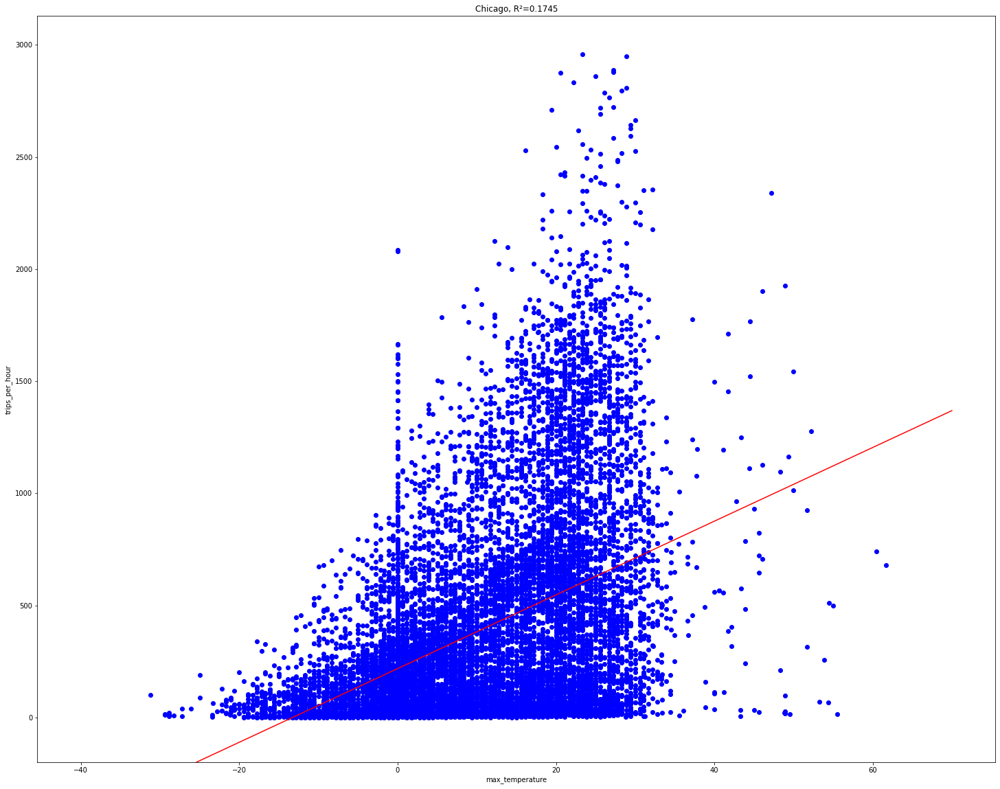

In [86]:
#singular linear regression: max temp vs trips per hour
X = chicago_final[["max_temp"]]
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)

lin_reg_single = LinearRegression(fit_intercept=True)
lin_reg_single.fit(X_train, y_train)
lin_reg_single_pred = lin_reg_single.predict(X_test)


fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(X_train,y_train, color="blue")

r2_lin_reg_single = r2_score(y_test, lin_reg_single_pred)

Z = np.linspace(-40,70)
T = lin_reg_single.intercept_ + lin_reg_single.coef_*Z

ax.plot(Z,T[0], color = 'red')

ax.set_title("Chicago, R²="+str(round(r2_lin_reg_single,4)))
ax.set_xlabel("max_temperature")
ax.set_ylabel("trips_per_hour")
ax.set_ylim(-200)

In [ ]:
#we can see that up until 35 degrees, temperature and amount of trips seem to have a linear correlation. Warmer-->more trips.
#However, after 35 degrees temperature there is a sudden drop. Probably, beacause a threshold i reached and it is already too hot for people.

Text(0, 0.5, 'trips_per_hour')

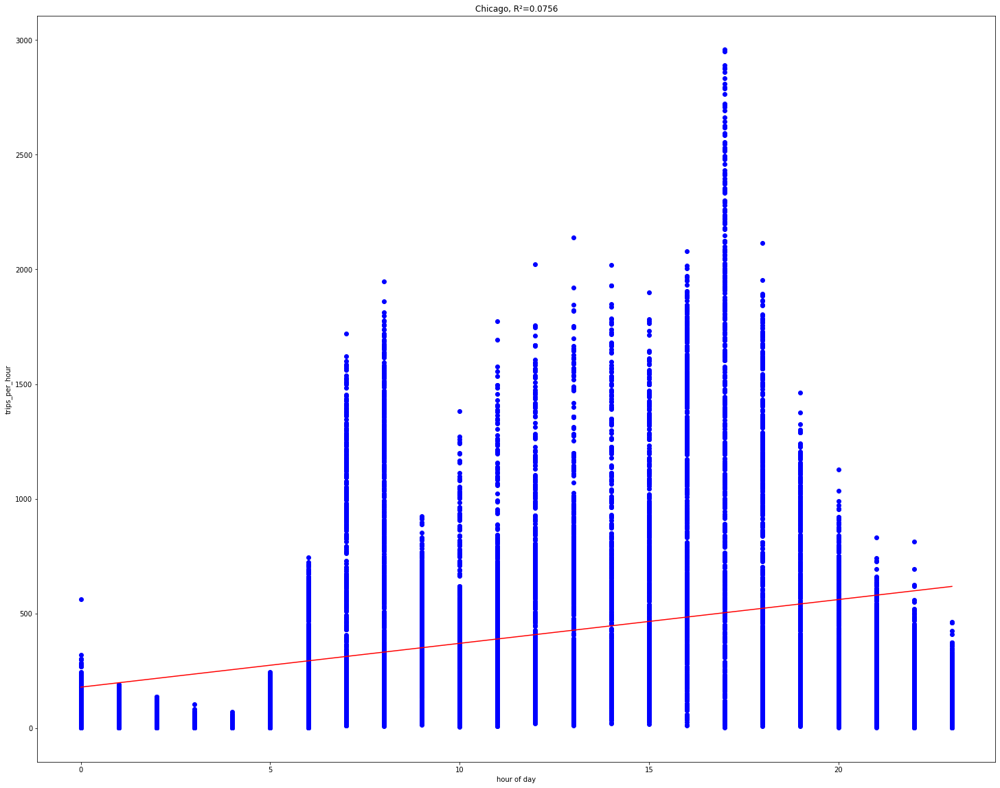

In [87]:
#singular linear regression: hour of day vs trips per hour
X = chicago_final[["hour_of_day"]]
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)

lin_reg_single = LinearRegression(fit_intercept=True)
lin_reg_single.fit(X_train, y_train)
lin_reg_single_pred = lin_reg_single.predict(X_test)


fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(X_train,y_train, color="blue")

r2_lin_reg_single = r2_score(y_test, lin_reg_single_pred)

Z = np.linspace(0,23)
T = lin_reg_single.intercept_ + lin_reg_single.coef_*Z

ax.plot(Z,T[0], color = 'red')

ax.set_title("Chicago, R²="+str(round(r2_lin_reg_single,4)))
ax.set_xlabel("hour of day")
ax.set_ylabel("trips_per_hour")

In [ ]:
#Like temperature, the correlation between hour of day and trips seems to be not linear.
##Therefore, let's try another regression model

Determination of Prediction coeficient:  0.8133263585657333


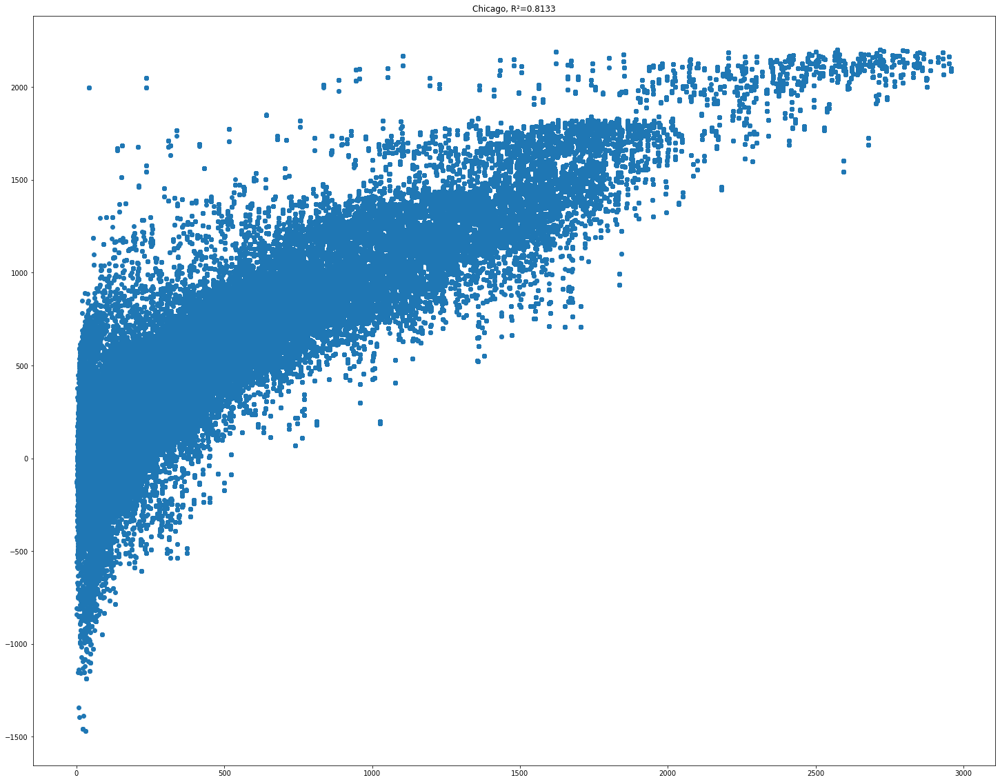

In [240]:
X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]


X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7, random_state=1)

regr = MLPRegressor(random_state=1, max_iter=500).fit(X_train, y_train)
mlp_reg_pred = regr.predict(X_test)

print('Determination of Prediction coeficient: ', regr.score(X_test, y_test))

fig, ax = plt.subplots(figsize=(25,20))

r2_mlp_reg = r2_score(y_test, mlp_reg_pred)
ax.set_title("Chicago, R²="+str(round(r2_mlp_reg,4)))

ax.scatter(y_test, mlp_reg_pred)

In [ ]:
#better, but still not good enough: alot of negative trip amount predictions also

No handles with labels found to put in legend.


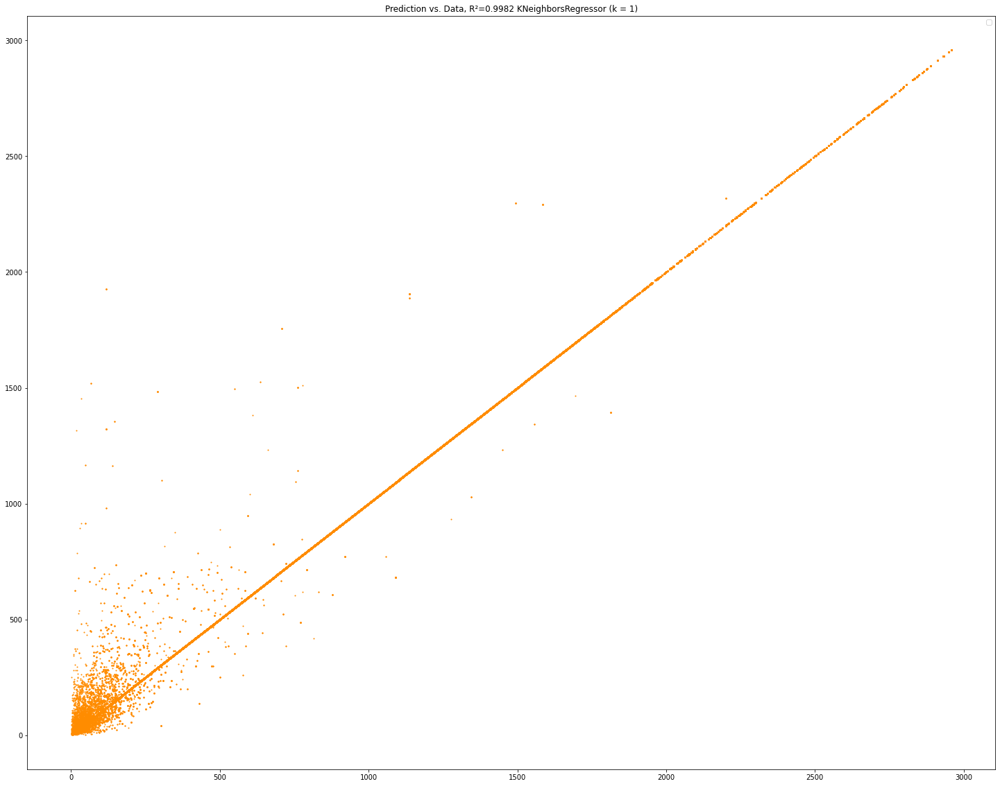

In [241]:
# Fit k neighbours regression model
n_neighbors = 1

X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]


X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7, random_state=6)


knn = neighbors.KNeighborsRegressor(n_neighbors).fit(X_train, y_train)
y_ = knn.predict(X_test)

fig, ax = plt.subplots(figsize=(25,20))

#plt.subplot(2, 1, i + 1)

ax.scatter(y_test, y_, color="darkorange",s=1)

r2_knn = r2_score(y_test, y_)
ax.set_title("Prediction vs. Data, R²="+str(round(r2_knn,4))+" KNeighborsRegressor (k = %i)" % (n_neighbors))
#plt.plot(X_test, y_, color="navy", label="prediction")
ax.axis("tight")
ax.legend()


In [ ]:
#seems to be very precise using 1 neares neighbours, only only performs bad when predicting few trips per hour

In [114]:
test_example = chicago_final.sample(5)

In [115]:
test_example.head()

,user_type,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,IsWeekday,precip_dummy
25647,0,6,49,8,2,30,1.1,False,0
20505,1,1,19,7,11,225,0.0,True,0
12338,0,1,35,28,22,84,31.1,True,0
5544,0,4,32,11,16,1774,23.3,True,0
25830,0,6,50,15,17,145,-5.6,False,0


In [116]:
ex1 = test_example.drop(columns=["trips_per_hour"])
ex2 = test_example[["trips_per_hour"]]

In [117]:
knn.predict(ex1)

array([[  38.],
       [ 225.],
       [  84.],
       [1774.],
       [ 145.]])

In [ ]:
##Arima Time Series Prediction

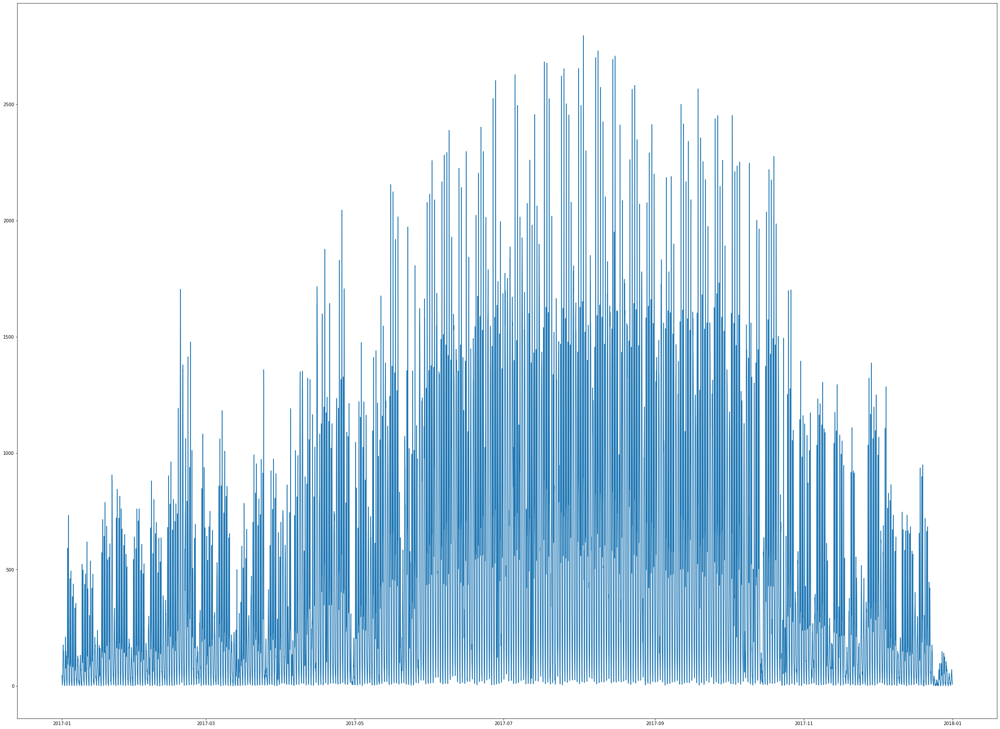

In [156]:
df_arima = chicago_final[['trips_per_hour']]


fig, ax = plt.subplots(figsize=(40,30))
ax.plot(df_arima)

In [718]:
#Let's decompose the data to remove trend and seasonality

<Figure size 432x288 with 0 Axes>

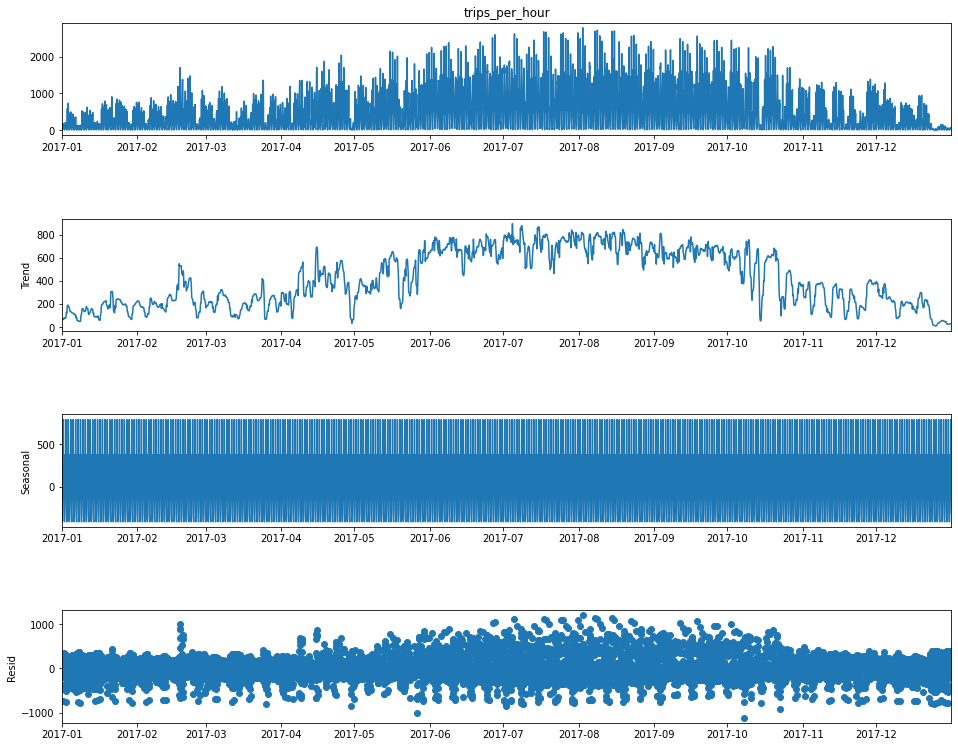

In [158]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df_arima['trips_per_hour'], model='additive', period=(24))

residual = result.resid
fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(15, 12)

In [ ]:
#we see seasonality and more or less a trend, indicating non-stationarity

In [159]:
#import Augmented Dickey-Fuller unit root test
from statsmodels.tsa.stattools import adfuller

#create rolling statistics function
def test_stationarity(timeseries):
    
    #Determing rolling statistics, 12 hours
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()
    fig, ax = plt.subplots(figsize=(40,30))
    #Plot rolling statistics:
    orig = ax.plot(timeseries, color='blue',label='Original')
    mean = ax.plot(rolmean, color='red', label='Rolling Mean')
    std = ax.plot(rolstd, color='black', label = 'Rolling Std')
    ax.legend(loc='best')
    ax.set_xlabel('hour of day')
    ax.set_ylabel('amount of trips')
    ax.set_title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:\n')
    dftest = adfuller(timeseries)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

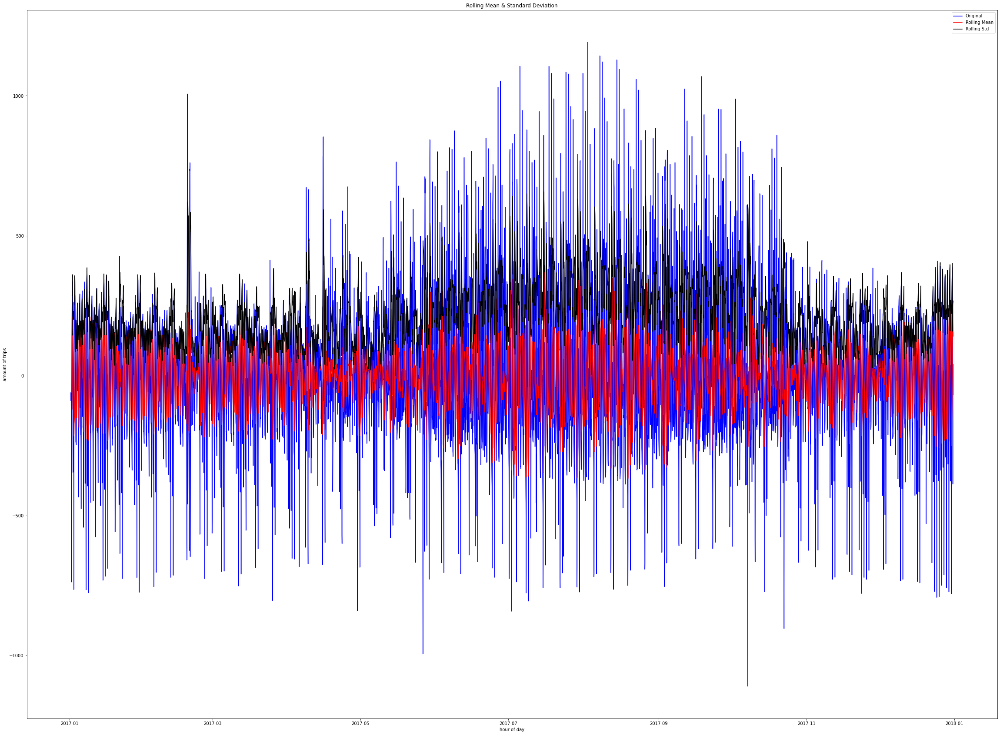

Results of Dickey-Fuller Test:

Test Statistic                  -30.890325
p-value                           0.000000
#Lags Used                       37.000000
Number of Observations Used    8698.000000
Critical Value (1%)              -3.431102
Critical Value (5%)              -2.861872
Critical Value (10%)             -2.566947
dtype: float64


In [160]:
#H0: Data is stationary
#H1: Data is non-stationary

#to check for stationarity we run statistics and Dickey Fuller test
residual.dropna(inplace=True)
test_stationarity(residual)

In [161]:
##Data seems to be stationary (high negative test statistic, very small p value, teststatistic < Critcal Value)
#not enough evidence to reject H0 hypothesis

(-0.2, 0.2)

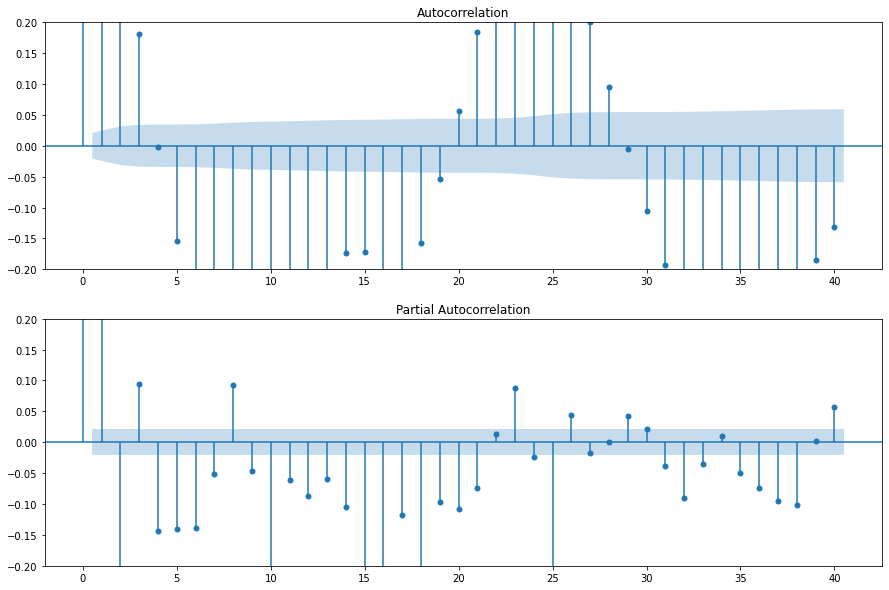

In [162]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(residual, ax=ax1, lags=40)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, ax=ax2, lags=40)
ax1.set_ylim([-0.2, 0.2])
ax2.set_ylim([-0.2, 0.2])

In [103]:
#Doesn't seem very promising, also data plotted and decomposition 

In [163]:
#provide explicit frequency for ARIMA
df_arima.index = df_arima.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                 8760
Model:                 ARIMA(1, 0, 3)   Log Likelihood              -59341.682
Date:                Sat, 08 Jan 2022   AIC                         118695.364
Time:                        19:56:13   BIC                         118737.831
Sample:                    01-01-2017   HQIC                        118709.834
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        423.2497     23.201     18.243      0.000     377.776     468.723
ar.L1          0.7482      0.016     45.598      0.000       0.716       0.780
ma.L1          0.6036      0.018     33.079      0.0

<AxesSubplot:xlabel='time_rounded'>

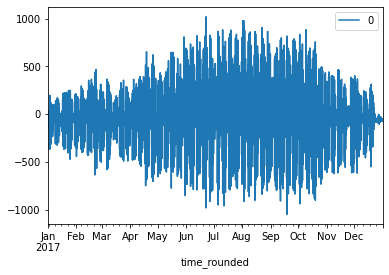

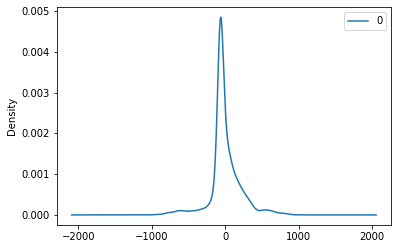

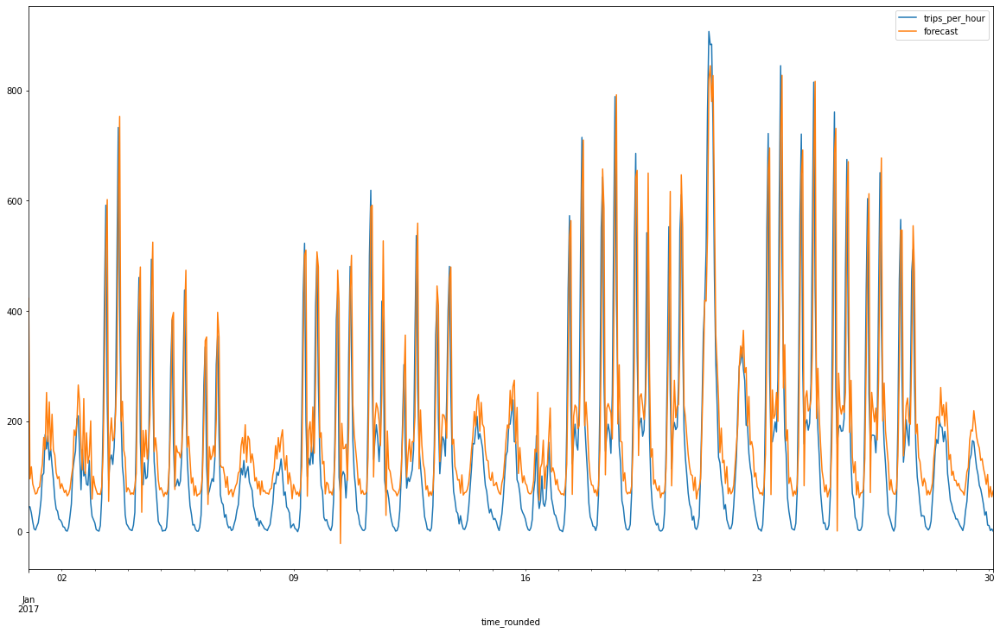

In [164]:
# Setting up ARIMA model
# p = AR = PACF lags = 16
# d = I = differences = 0
# q = MA = ACF lags = 3

model = ARIMA(df_arima, order=(1,0,3))
model_fit = model.fit()
df_arima['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_arima[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [ ]:
#Not bad, lets try differencing either way (assume data is not stationary)

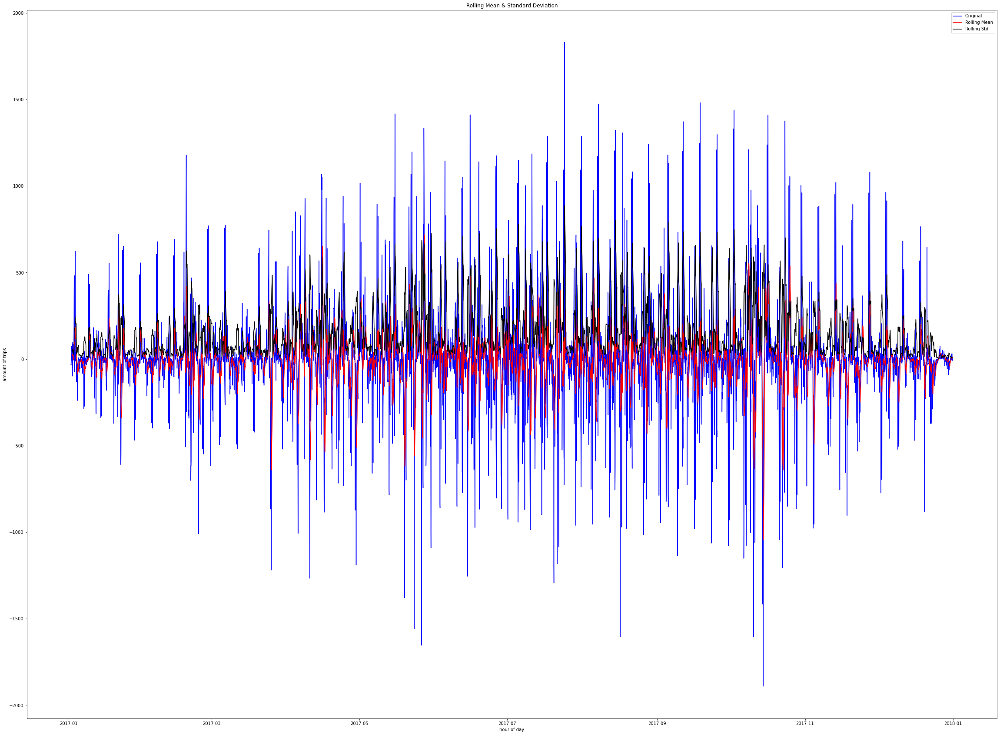

Results of Dickey-Fuller Test:

Test Statistic                -1.772671e+01
p-value                        3.449216e-30
#Lags Used                     3.600000e+01
Number of Observations Used    8.699000e+03
Critical Value (1%)           -3.431102e+00
Critical Value (5%)           -2.861872e+00
Critical Value (10%)          -2.566947e+00
dtype: float64


In [167]:
df_arima = chicago_final[['trips_per_hour']]

first_diff = df_arima['trips_per_hour'].diff(24).dropna()


test_stationarity(first_diff)

(-0.2, 0.2)

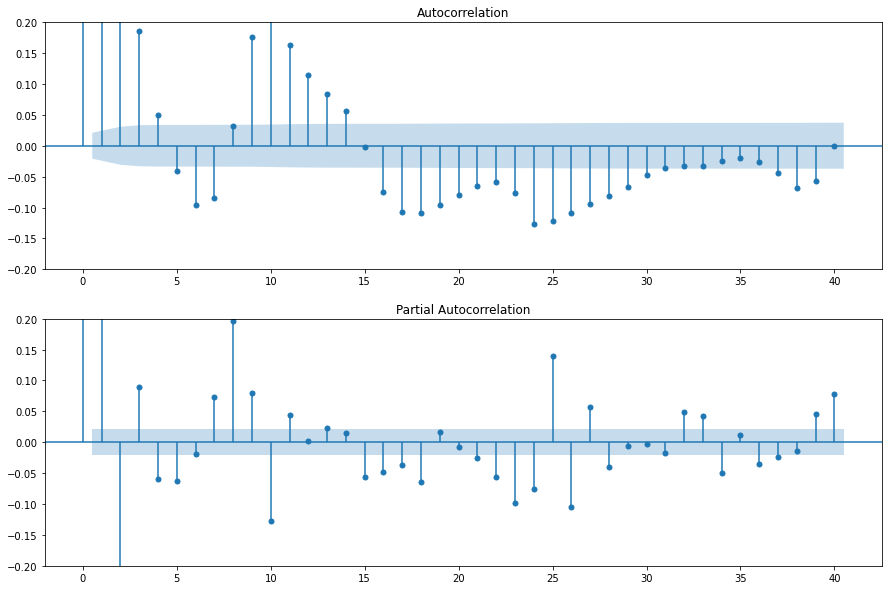

In [168]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(first_diff, ax=ax1, lags=40)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(first_diff, ax=ax2, lags=40)
ax1.set_ylim([-0.2, 0.2])
ax2.set_ylim([-0.2, 0.2])

In [169]:
df_arima.index = df_arima.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                 8760
Model:                 ARIMA(1, 1, 0)   Log Likelihood              -60265.260
Date:                Sat, 08 Jan 2022   AIC                         120534.519
Time:                        19:59:49   BIC                         120548.675
Sample:                    01-01-2017   HQIC                        120539.343
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3335      0.006     52.659      0.000       0.321       0.346
sigma2      5.544e+04    475.796    116.513      0.000    5.45e+04    5.64e+04
Ljung-Box (L1) (Q):                 108.88   Jarque-

<AxesSubplot:xlabel='time_rounded'>

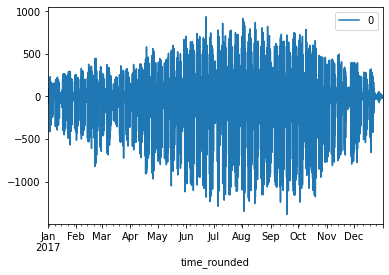

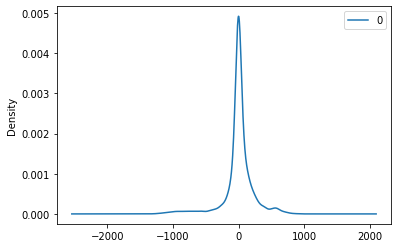

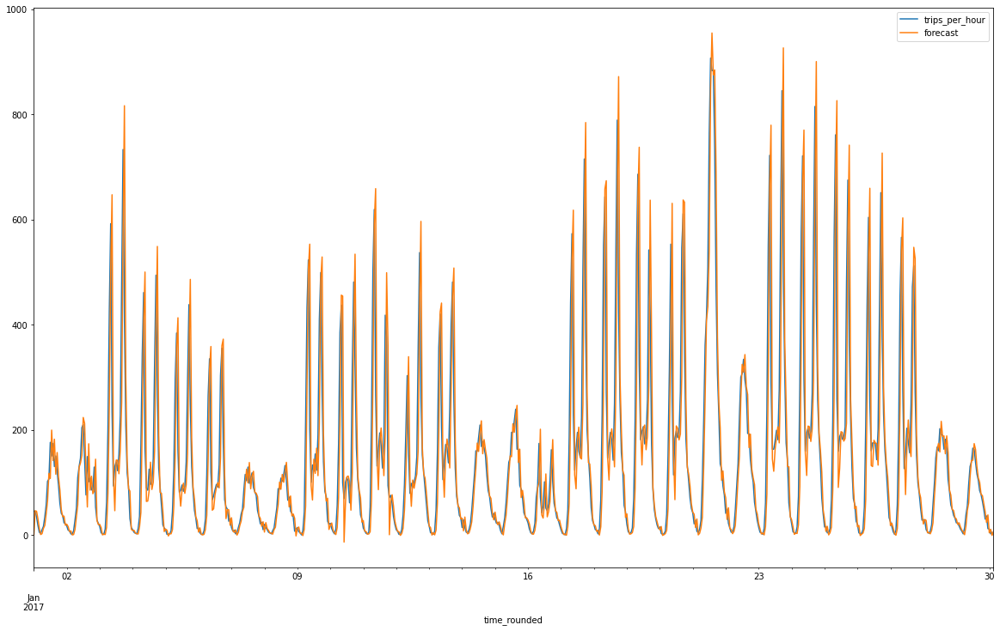

In [170]:
# Setting up ARIMA model
# p = AR = PACF lags = 1
# d = I = differences = 1
# q = MA = ACF lags

model = ARIMA(df_arima, order=(1,1,0))
model_fit = model.fit()
df_arima['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_arima[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [171]:
df_arima.sample(20)

,trips_per_hour,forecast
time_rounded,,
2017-06-16 03:00,18.0,32.667455
2017-04-07 15:00,527.0,397.334438
2017-12-29 09:00,65.0,106.667455
2017-01-26 16:00,425.0,220.342484
2017-02-09 21:00,115.0,101.657990
2017-07-20 21:00,525.0,637.625806
2017-09-28 15:00,820.0,660.329231
2017-09-16 01:00,137.0,150.321659
2017-07-06 08:00,1485.0,1398.763061


In [ ]:
##SARIMAX

In [172]:
df_sarimax = chicago_final[['trips_per_hour']]

first_diff = df_sarimax.diff(24).dropna()

In [174]:
df_sarimax.index = df_sarimax.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                 8760
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -60265.260
Date:                Mon, 10 Jan 2022   AIC                         120534.519
Time:                        12:54:26   BIC                         120548.675
Sample:                    01-01-2017   HQIC                        120539.343
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3335      0.006     52.659      0.000       0.321       0.346
sigma2      5.544e+04    475.796    116.513      0.000    5.45e+04    5.64e+04
Ljung-Box (L1) (Q):                 108.88   Jarque-

<AxesSubplot:xlabel='time_rounded'>

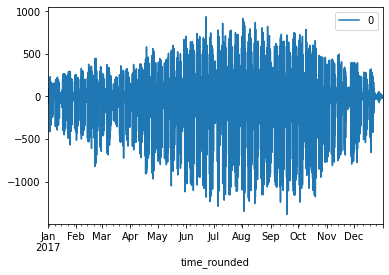

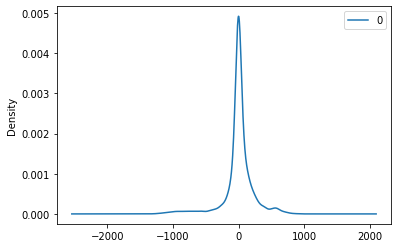

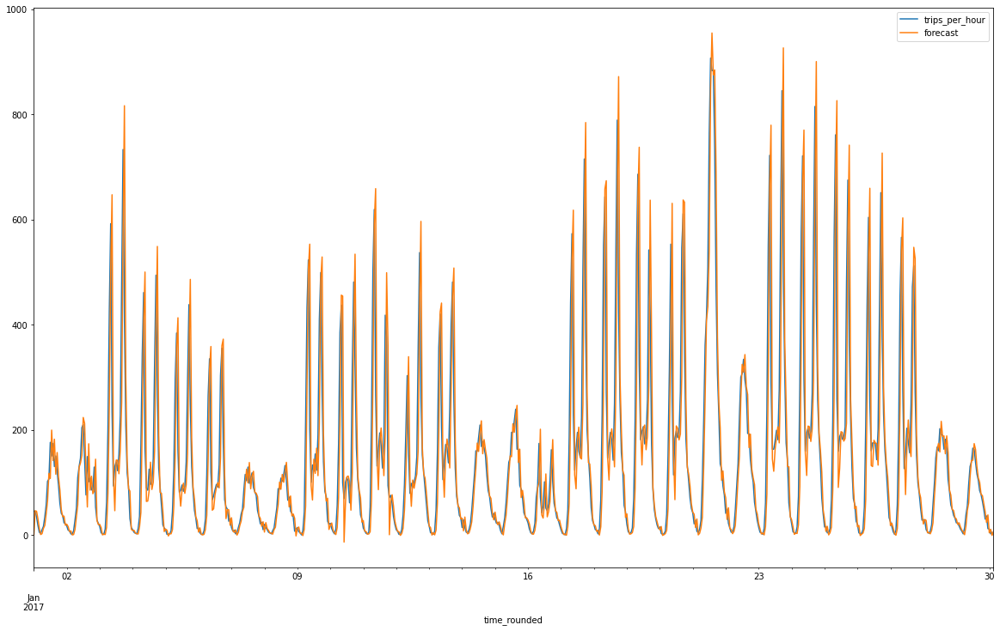

In [175]:
# 12 month = yearly 
sarimax_model = SARIMAX(df_sarimax, order=(1,1,0), seasonal_order=(0,0,0,12))

model_fit = sarimax_model.fit()
df_sarimax['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_sarimax[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [176]:
df_sarimax[['trips_per_hour','forecast']].sample(15)

,trips_per_hour,forecast
time_rounded,,
2017-06-25 16:00,1411.0,1551.668875
2017-12-04 04:00,20.0,14.000947
2017-02-14 03:00,2.0,1.332545
2017-08-15 13:00,829.0,859.349583
2017-08-23 14:00,804.0,872.338697
2017-06-25 18:00,1101.0,1329.657043
2017-10-13 22:00,301.0,315.318819
2017-04-11 06:00,305.0,100.343904
2017-03-21 22:00,62.0,106.657043


In [6]:
# import keras libraries

#from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout

In [144]:
# Splitting into train and test set
X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)



In [146]:
# Normalizing training data
from sklearn.preprocessing import StandardScaler

st_scaler = StandardScaler()
st_scaler.fit(X_train)
X_train_scaled = st_scaler.transform(X_train)

In [147]:
model = Sequential(
    [Dense(36, activation="relu", input_shape=[X_train.shape[1]]),
    Dense(36, activation="relu"),
     Dense(1)])

In [148]:
# Compiling the ANN

model.compile(loss='mse',
             optimizer="adam",
             metrics=["mae", "mse"])

In [149]:
epochs = 20

history = model.fit(X_train_scaled, y_train.values,
                   epochs=epochs, validation_split=0.2)

Epoch 1/20
154/154 [==============================] - 1s 5ms/step - loss: 393263.5938 - mae: 410.4973 - mse: 393263.5938 - val_loss: 426884.5000 - val_mae: 418.4873 - val_mse: 426884.5000
Epoch 2/20
154/154 [==============================] - 0s 3ms/step - loss: 322220.9062 - mae: 358.3477 - mse: 322220.9062 - val_loss: 287039.7188 - val_mae: 343.3797 - val_mse: 287039.7188
Epoch 3/20
154/154 [==============================] - 1s 4ms/step - loss: 202403.7188 - mae: 307.3657 - mse: 202403.7188 - val_loss: 199811.9062 - val_mae: 329.2848 - val_mse: 199811.9062
Epoch 4/20
154/154 [==============================] - 0s 3ms/step - loss: 175125.1094 - mae: 305.2068 - mse: 175125.1094 - val_loss: 191588.2812 - val_mae: 331.6443 - val_mse: 191588.2812
Epoch 5/20
154/154 [==============================] - 0s 3ms/step - loss: 173081.2500 - mae: 306.7863 - mse: 173081.2500 - val_loss: 190199.7500 - val_mae: 329.9745 - val_mse: 190199.7500
Epoch 6/20
154/154 [==============================] - 1s 3ms

In [150]:
model.predict(X_train_scaled[:10])

array([[ 45.386158],
       [355.49448 ],
       [ 14.172836],
       [425.58566 ],
       [318.22537 ],
       [ 31.501947],
       [347.46198 ],
       [354.51038 ],
       [432.96637 ],
       [477.1861  ]], dtype=float32)

In [151]:
history_df = pd.DataFrame(history.history)
history_df

,loss,mae,mse,val_loss,val_mae,val_mse
0,393263.593750,410.497314,393263.593750,426884.500000,418.487335,426884.500000
1,322220.906250,358.347748,322220.906250,287039.718750,343.379669,287039.718750
2,202403.718750,307.365662,202403.718750,199811.906250,329.284760,199811.906250
3,175125.109375,305.206818,175125.109375,191588.281250,331.644287,191588.281250
4,173081.250000,306.786285,173081.250000,190199.750000,329.974548,190199.750000
5,172190.031250,305.835419,172190.031250,189390.703125,329.056976,189390.703125
6,171573.546875,305.436371,171573.546875,189343.250000,327.435486,189343.250000
7,171346.093750,304.414459,171346.093750,188742.015625,327.022705,188742.015625
8,170980.468750,304.539703,170980.468750,187761.593750,327.126099,187761.593750
9,170602.343750,303.704102,170602.343750,187572.203125,326.558563,187572.203125


In [152]:
root_metrics_df = history_df[["mse", "val_mse"]].apply(np.sqrt)
root_metrics_df.rename({"mse":"rmse", "val_mse":"val_rmse"}, axis=1, inplace=True)
root_metrics_df

,rmse,val_rmse
0,627.107322,653.363987
1,567.645053,535.760878
2,449.893008,447.003251
3,418.479521,437.707986
4,416.030347,436.118963
5,414.957867,435.190422
6,414.214373,435.135898
7,413.939722,434.444491
8,413.497846,433.314659
9,413.040366,433.096067


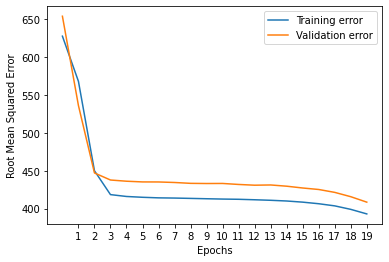

In [153]:
plt.Figure(figsize=(14,6), dpi=100)

plt.plot(root_metrics_df["rmse"], label = 'Training error')
plt.plot(root_metrics_df["val_rmse"], label = 'Validation error')

plt.xlabel("Epochs")
plt.ylabel("Root Mean Squared Error")

# plt.xlim([0, epochs])
plt.xticks(range(1,20))
plt.legend()

plt.show()

In [154]:
# Prediction on test set

X_test_scaled = st_scaler.transform(X_test)
y_pred = model.predict(X_test_scaled)

In [155]:
# Report regression performance on test set

print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_pred)))
print("MAE: ", mean_absolute_error(y_test, y_pred))

RMSE:  397.7130792136907
MAE:  285.6104611038617
